# input
data# 11013, img_size 64*64,

In [10]:
import numpy as np
import zipfile
import io
import glob
from PIL import Image

import tensorflow as tf
import matplotlib.pyplot as plt
import math
import time
%matplotlib inline

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def dataset_zip2imgarray(datadir, imgsize):
    with zipfile.ZipFile(datadir) as data:
        datalist = data.namelist()
        datasize = len(datalist)
        
        x = np.zeros((datasize, imgsize, imgsize, 3))
        nonelist=[]
        for i, fname in enumerate(datalist):
            if fname[-4:] == 'jpeg':
                try:
                    img = Image.open(
                        io.BytesIO(data.read(fname))).resize((imgsize, imgsize))
                    x[i] = np.asarray(img)
                except OSError:
                    nonelist.append(i)
            else:
                nonelist.append(i)
                
        xs = np.delete(x, nonelist, 0)
    return xs

## load data
datadir = ['data/images_part1.zip', 'data/images_part2.zip',
          'data/images_part3.zip']
imgsize=64
train_samples=None
for d in datadir:
    x = dataset_zip2imgarray(d, imgsize)/255.0
    if train_samples is None:
        train_samples = x
    else:
        train_samples = np.concatenate([train_samples, x], 0)

test_samples = dataset_zip2imgarray('data/images_part4.zip', imgsize)/255.0
        

In [3]:
def viz_grid(Xs, padding):
    N, H, W, C = Xs.shape
    grid_size = int(math.ceil(math.sqrt(N)))
    grid_height = H * grid_size + padding * (grid_size + 1)
    grid_width = W * grid_size + padding * (grid_size + 1)
    grid = np.zeros((grid_height, grid_width, C))
    next_idx = 0
    y0, y1 = padding, H + padding
    for y in range(grid_size):
        x0, x1 = padding, W + padding
        for x in range(grid_size):
            if next_idx < N:
                img = Xs[next_idx]
                grid[y0:y1, x0:x1] = img
                next_idx += 1
            x0 += W + padding
            x1 += W + padding
        y0 += H + padding
        y1 += H + padding
    return grid

def set_seed(seed):
    np.random.seed(seed)
    tf.random.set_random_seed(seed)

def conv2d(input, kernel_size, stride, num_filter, name = 'conv2d'):
    with tf.variable_scope(name):
        stride_shape = [1, stride, stride, 1]
        filter_shape = [kernel_size, kernel_size, input.get_shape()[3], num_filter]

        W = tf.get_variable('w', filter_shape, tf.float32, tf.random_normal_initializer(0.0, 0.02))
        b = tf.get_variable('b', [1, 1, 1, num_filter], initializer = tf.constant_initializer(0.0))
        return tf.nn.conv2d(input, W, stride_shape, padding = 'SAME') + b

def conv2d_transpose(input, kernel_size, stride, num_filter, name = 'conv2d_transpose'):
    with tf.variable_scope(name):
        stride_shape = [1, stride, stride, 1]
        filter_shape = [kernel_size, kernel_size, num_filter, input.get_shape()[3]]
        output_shape = tf.stack([tf.shape(input)[0], tf.shape(input)[1] * 2, tf.shape(input)[2] * 2, num_filter])

        W = tf.get_variable('w', filter_shape, tf.float32, tf.random_normal_initializer(0.0, 0.02))
        b = tf.get_variable('b', [1, 1, 1, num_filter], initializer = tf.constant_initializer(0.0))
        return tf.nn.conv2d_transpose(input, W, output_shape, stride_shape, padding = 'SAME') + b

def fc(input, num_output, name = 'fc'):
    with tf.variable_scope(name):
        num_input = input.get_shape()[1]
        W = tf.get_variable('w', [num_input, num_output], tf.float32, tf.random_normal_initializer(0.0, 0.02))
        b = tf.get_variable('b', [num_output], initializer = tf.constant_initializer(0.0))
        return tf.matmul(input, W) + b

def batch_norm(input, is_training):
    out = tf.contrib.layers.batch_norm(input, decay = 0.99, center = True, scale = True,
                                       is_training = is_training, updates_collections = None)
    return out

def leaky_relu(input, alpha = 0.2):
    return tf.maximum(alpha * input, input)

In [11]:
class DCGAN(object):

    def __init__(self):
        self.num_epoch = 50 ## 
        self.batch_size = 32
        self.log_step = 50
        self.visualize_step = 200
        self.code_size = 256 ## 64 ==>256
        self.learning_rate = 1e-4
        self.vis_learning_rate = 1e-2
        self.recon_steps = 100
        self.actmax_steps = 100
        
        self._dis_called = False
        self._gen_called = False

        self.tracked_noise = np.random.normal(0, 1, [16, self.code_size]) ## 64 => 16

        self.real_input = tf.placeholder(tf.float32, [None, 64, 64, 3]) ## 32 =>64
        self.real_label = tf.placeholder(tf.float32, [None, 1])
        self.fake_label = tf.placeholder(tf.float32, [None, 1])
        self.noise = tf.placeholder(tf.float32, [None, self.code_size])
        
        self.is_train = tf.placeholder(tf.bool)
        
        self.recon_sample = tf.placeholder(tf.float32, [1, 64, 64, 3]) ## 32 =>64
        self.actmax_label = tf.placeholder(tf.float32, [1, 1])
        
        with tf.variable_scope('actmax'):
            self.actmax_code = tf.get_variable('actmax_code', [1, self.code_size],
                                               initializer = tf.constant_initializer(0.0))
        
        self._init_ops()

    def _discriminator(self, input):
        # We have multiple instances of the discriminator in the same computation graph,
        # so set variable sharing if this is not the first invocation of this function.
        with tf.variable_scope('dis', reuse = self._dis_called):
            self._dis_called = True
            dis_conv0 = conv2d(input, 4, 2, 16, 'conv0')
            dis_lrelu0 = leaky_relu(dis_conv0)
            dis_conv1 = conv2d(dis_lrelu0, 4, 2, 32, 'conv1')
            dis_lrelu1 = leaky_relu(dis_conv1)
            dis_conv2 = conv2d(dis_lrelu1, 4, 2, 64, 'conv2')
            dis_batchnorm2 = batch_norm(dis_conv2, self.is_train)
            dis_lrelu2 = leaky_relu(dis_batchnorm2)
            dis_conv3 = conv2d(dis_lrelu2, 4, 2, 128, 'conv3')
            dis_batchnorm3 = batch_norm(dis_conv3, self.is_train)
            dis_lrelu3 = leaky_relu(dis_batchnorm3)
            dis_reshape3 = tf.reshape(dis_lrelu3, [-1, 4 * 4 * 128])
            dis_fc4 = fc(dis_reshape3, 1, 'fc4')
            return dis_fc4

    def _generator(self, input):
        with tf.variable_scope('gen', reuse = self._gen_called):
            self._gen_called = True
            gen_fc1 = fc(input, 4 * 4 * 128, 'fc1')
            gen_reshape1 = tf.reshape(gen_fc1, [-1, 4, 4, 128])
            gen_batchnorm1 = batch_norm(gen_reshape1, self.is_train)
            gen_lrelu1 = leaky_relu(gen_batchnorm1)
            gen_conv2 = conv2d_transpose(gen_lrelu1, 4, 2, 64, 'conv2')
            gen_batchnorm2 = batch_norm(gen_conv2, self.is_train)
            gen_lrelu2 = leaky_relu(gen_batchnorm2)
            gen_conv3 = conv2d_transpose(gen_lrelu2, 4, 2, 32, 'conv3')
            gen_batchnorm3 = batch_norm(gen_conv3, self.is_train)
            gen_lrelu3 = leaky_relu(gen_batchnorm3)
            gen_conv3_5 = conv2d_transpose(gen_lrelu3, 4, 2, 16, 'conv3.5')
            gen_batchnorm3_5 = batch_norm(gen_conv3_5, self.is_train)
            gen_lrelu3_5 = leaky_relu(gen_batchnorm3_5)
            gen_conv4 = conv2d_transpose(gen_lrelu3_5, 4, 2, 3, 'conv4')
            gen_sigmoid4 = tf.sigmoid(gen_conv4)
            return gen_sigmoid4

    def _loss(self, labels, logits):
        loss = tf.nn.sigmoid_cross_entropy_with_logits(labels = labels, logits = logits)
        return tf.reduce_mean(loss)

    def _reconstruction_loss(self, generated, target):
        loss = tf.nn.l2_loss(generated - target)
        return tf.reduce_mean(loss)
    
    # Define operations
    def _init_ops(self):
        
        ################################################################################
        # Prob 2-1: complete the definition of these operations                        #
        ################################################################################
        
        # self.fake_samples_op = None
        self.fake_samples_op = self._generator(self.noise)
        
        # self.dis_loss_op = None
        #  E[L(D(x),1)] + E[L(G(z),0)]
        #self.dis_loss_op = self._loss(self.real_label, self._discriminator(self.real_input)) + self._loss(
        #    self.fake_label, self._discriminator(self.fake_samples_op))
        self.dis_loss_op = self._loss(self.real_label, 
                                      self._discriminator(self.real_input)
                                      ) + self._loss(self.fake_label,
            self._discriminator(self.fake_samples_op))
        
        # self.gen_loss_op = None
        self.gen_loss_op = self._loss(self.real_label,
                                      self._discriminator(self.fake_samples_op))
        
        ################################################################################
        # Prob 2-1: fix the definition of these operations                             #
        ################################################################################
        
        # dis_optimizer = tf.train.RMSPropOptimizer(self.learning_rate)
        # self.dis_train_op = dis_optimizer.minimize(self.dis_loss_op)
        dis_train_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,
                                     "dis")
        dis_optimizer = tf.train.RMSPropOptimizer(self.learning_rate)
        self.dis_train_op = dis_optimizer.minimize(self.dis_loss_op,
                                                   var_list=dis_train_vars)
        
        # gen_optimizer = tf.train.RMSPropOptimizer(self.learning_rate)
        # self.gen_train_op = gen_optimizer.minimize(self.gen_loss_op)
        gen_train_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,
                                     "gen")
        gen_optimizer = tf.train.RMSPropOptimizer(self.learning_rate)
        self.gen_train_op = gen_optimizer.minimize(self.gen_loss_op,
                                                  var_list=gen_train_vars)
        
        ################################################################################
        # Prob 2-4: check the definition of these operations                           #
        # skip this part when working on problem 2-1 and come back for problem 2-4     #
        ################################################################################
        
        self.actmax_sample_op = self._generator(self.actmax_code)
        actmax_dis = self._discriminator(self.actmax_sample_op)
        self.actmax_loss_op = self._loss(self.actmax_label, actmax_dis)

        actmax_optimizer = tf.train.AdamOptimizer(self.vis_learning_rate)
        self.actmax_op = actmax_optimizer.minimize(self.actmax_loss_op, var_list = [self.actmax_code])
        
        ################################################################################
        # Prob 2-4: complete the definition of these operations                        #
        # skip this part when working on problem 2-1 and come back for problem 2-4     #
        ################################################################################
        
        # self.recon_loss_op = None
        self.recon_loss_op = self._reconstruction_loss(self.actmax_sample_op, self.recon_sample)
        
        # recon_optimizer = tf.train.AdamOptimizer(self.vis_learning_rate)
        recon_optimizer = tf.train.AdamOptimizer(self.vis_learning_rate)
        
        # self.reconstruct_op = recon_optimizer.minimize(self.recon_loss_op)
        self.reconstruct_op = recon_optimizer.minimize(self.recon_loss_op)
        
        
        ################################################################################
        #                               END OF YOUR CODE                               #
        ################################################################################

    # Training function
    def train(self, sess, train_samples):
        sess.run(tf.global_variables_initializer())

        num_train = train_samples.shape[0]
        step = 0
        
        # smooth the loss curve so that it does not fluctuate too much
        smooth_factor = 0.95
        plot_dis_s = 0
        plot_gen_s = 0
        plot_ws = 0
        
        dis_losses = []
        gen_losses = []
        max_steps = int(self.num_epoch * (num_train // self.batch_size))
        print('Start training ...')
        start_time = time.time()
        for epoch in range(self.num_epoch):
            for i in range(num_train // self.batch_size):
                step += 1

                batch_samples = train_samples[i * self.batch_size : (i + 1) * self.batch_size]
                noise = np.random.normal(0, 1, [self.batch_size, self.code_size])
                zeros = np.zeros([self.batch_size, 1])
                ones = np.ones([self.batch_size, 1])
        
                ################################################################################
                # Prob 2-1: complete the feed dictionary                                       #
                ################################################################################
                
                # dis_feed_dict = {}
                dis_feed_dict = {self.real_input:batch_samples, self.real_label:zeros,
                                self.fake_label:ones, self.noise:noise, self.is_train:True}
                
                ################################################################################
                #                               END OF YOUR CODE                               #
                ################################################################################

                _, dis_loss = sess.run([self.dis_train_op, self.dis_loss_op], feed_dict = dis_feed_dict)
        
                ################################################################################
                # Prob 2-1: complete the feed dictionary                                       #
                ################################################################################
                
                # gen_feed_dict = {}
                gen_feed_dict = {self.noise:noise, self.real_label:zeros,
                                 self.fake_label:ones, self.is_train:True}
                
                ################################################################################
                #                               END OF YOUR CODE                               #
                ################################################################################

                _, gen_loss = sess.run([self.gen_train_op, self.gen_loss_op], feed_dict = gen_feed_dict)

                plot_dis_s = plot_dis_s * smooth_factor + dis_loss * (1 - smooth_factor)
                plot_gen_s = plot_gen_s * smooth_factor + gen_loss * (1 - smooth_factor)
                plot_ws = plot_ws * smooth_factor + (1 - smooth_factor)
                dis_losses.append(plot_dis_s / plot_ws)
                gen_losses.append(plot_gen_s / plot_ws)

                if step % self.log_step == 0:
                    step_end_time = time.time()
                    per_step_ptime = step_end_time - start_time
                    start_time = step_end_time
                    print('Iteration {0}/{1}: dis loss = {2:.4f}, gen loss = {3:.4f}, {4:.2f} sec'.format(
                        step, max_steps, dis_loss, gen_loss, per_step_ptime))

            fig = plt.figure(figsize = (8, 8))   
            ax1 = plt.subplot(111)
            ax1.imshow(viz_grid(self.generate(self.tracked_noise), 1))
            plt.show()

            plt.plot(dis_losses)
            plt.title('discriminator loss')
            plt.xlabel('iterations')
            plt.ylabel('loss')
            plt.show()

            plt.plot(gen_losses)
            plt.title('generator loss')
            plt.xlabel('iterations')
            plt.ylabel('loss')
            plt.show()
        print('... Done!')

    # Find the reconstruction of one input sample
    def reconstruct_one_sample(self, sample):
        
        ################################################################################
        # Prob 2-4: initialize self.actmax_code                                        #
        # skip this part when working on problem 2-1 and come back for problem 2-4     #
        ################################################################################
        
        # actmax_init_val = None
        ## sample <class 'numpy.ndarray'> (1, 32, 32, 3)
        #sample_tf = tf.convert_to_tensor(sample, dtype = tf.float32)
        #act_ini_run = sess.run(self._discriminator(sample_tf), feed_dict={self.is_train:False})
        #act_ini_run = tf.get_default_graph().get_tensor_by_name("conv3:0")
        #act_ini_bn = batch_norm(act_ini_run, False)
        #act_ini_lrelu = leaky_relu(act_ini_bn)
        #act_ini_reshape = tf.reshape(act_ini_lrelu, [-1, 4 * 4 * 128])
        #actmax_init_val = act_ini_reshape
        
        
        #sample_tf = tf.convert_to_tensor(sample, dtype = tf.float32)
        #actmax_init_val = self._discriminator(sample_tf)
        #actmax_init_val = sample_tf
        #actmax_init_val = self.tracked_noise
        actmax_init_val = np.random.normal(0, 1, [1, self.code_size])
        
        #print('act_ini', actmax_init_val, actmax_init_val.shape)
        
        #actmax_init_val = self.generate_one_sample(sample)
       
        
        
        ################################################################################
        #                               END OF YOUR CODE                               #
        ################################################################################
        
        sess.run(self.actmax_code.assign(actmax_init_val))
        last_reconstruction = None
        last_loss = None
        for i in range(self.recon_steps):
        
            ################################################################################
            # Prob 2-4: complete the feed dictionary                                       #
            # skip this part when working on problem 2-1 and come back for problem 2-4     #
            ################################################################################   
            
            # recon_feed_dict = {}
            recon_feed_dict = {self.recon_sample: sample, self.actmax_label: np.ones([1, 1]),
                               self.is_train: True}
            
            ################################################################################
            #                               END OF YOUR CODE                               #
            ################################################################################
            
            run_ops = [self.recon_loss_op, self.reconstruct_op, self.actmax_sample_op]
            last_loss, _, last_reconstruction = sess.run(run_ops, feed_dict = recon_feed_dict)
        return last_loss, last_reconstruction

    # Find the reconstruction of a batch of samples
    def reconstruct(self, samples):
        reconstructions = np.zeros(samples.shape)
        total_loss = 0
        for i in range(samples.shape[0]):
            loss, reconstructions[i:i+1] = self.reconstruct_one_sample(samples[i:i+1])
            total_loss += loss
        return total_loss / samples.shape[0], reconstructions

    # Generates a single sample from input code
    def generate_one_sample(self, code):
        
        ################################################################################
        # Prob 2-1: complete the feed dictionary                                       #
        ################################################################################
        
        # gen_vis_feed_dict = {}
        gen_vis_feed_dict = {self.noise:code, self.is_train:False}
        
        ################################################################################
        #                               END OF YOUR CODE                               #
        ################################################################################
        
        generated = sess.run(self.fake_samples_op, feed_dict = gen_vis_feed_dict)
        return generated

    # Generates samples from input batch of codes
    def generate(self, codes):
        generated = np.zeros((codes.shape[0], 64, 64, 3))  ## 32 =>64
        for i in range(codes.shape[0]):
            generated[i:i+1] = self.generate_one_sample(codes[i:i+1])
        return generated

    # Perform activation maximization on one initial code
    def actmax_one_sample(self, initial_code):
        
        ################################################################################
        # Prob 2-4: check this function                                                #
        # skip this part when working on problem 2-1 and come back for problem 2-4     #
        ################################################################################
        
        actmax_init_val = tf.convert_to_tensor(initial_code, dtype = tf.float32)
        sess.run(self.actmax_code.assign(actmax_init_val))
        for i in range(self.actmax_steps):
            actmax_feed_dict = {
                self.actmax_label: np.ones([1, 1]),
                self.is_train: False
            }
            _, last_actmax = sess.run([self.actmax_op, self.actmax_sample_op], feed_dict = actmax_feed_dict)
        return last_actmax

    # Perform activation maximization on a batch of different initial codes
    def actmax(self, initial_codes):
        actmax_results = np.zeros((initial_codes.shape[0], 64, 64, 3)) ## 32 =>64
        for i in range(initial_codes.shape[0]):
            actmax_results[i:i+1] = self.actmax_one_sample(initial_codes[i:i+1])
        return actmax_results.clip(0, 1)

Start training ...
Iteration 50/17200: dis loss = 0.5795, gen loss = 1.7170, 2.79 sec
Iteration 100/17200: dis loss = 0.0777, gen loss = 3.8201, 1.78 sec
Iteration 150/17200: dis loss = 0.0178, gen loss = 4.9505, 1.72 sec
Iteration 200/17200: dis loss = 0.0062, gen loss = 6.0784, 1.71 sec
Iteration 250/17200: dis loss = 0.0240, gen loss = 5.8030, 1.70 sec
Iteration 300/17200: dis loss = 0.0060, gen loss = 5.8201, 1.73 sec


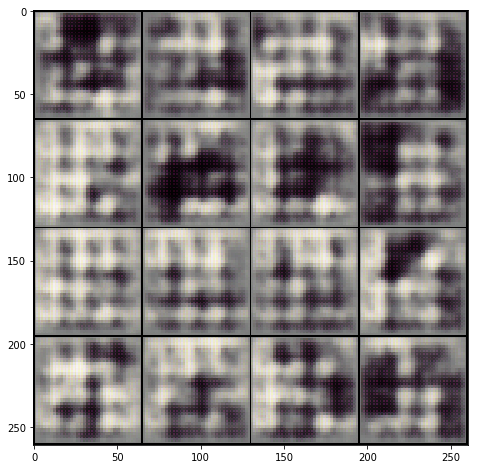

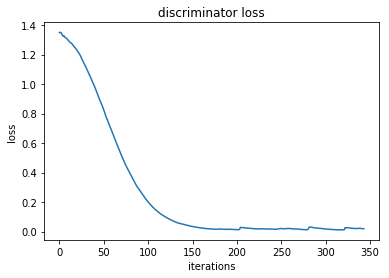

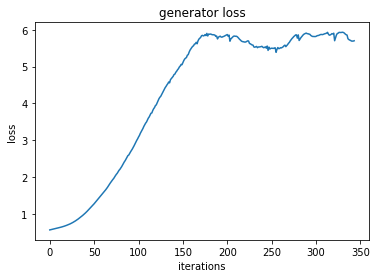

Iteration 350/17200: dis loss = 0.0108, gen loss = 6.5861, 2.15 sec
Iteration 400/17200: dis loss = 0.0230, gen loss = 8.2102, 1.73 sec
Iteration 450/17200: dis loss = 0.0007, gen loss = 8.7969, 1.74 sec
Iteration 500/17200: dis loss = 0.0082, gen loss = 5.6846, 1.73 sec
Iteration 550/17200: dis loss = 0.0085, gen loss = 5.6027, 1.74 sec
Iteration 600/17200: dis loss = 1.3036, gen loss = 0.0454, 1.70 sec
Iteration 650/17200: dis loss = 0.0167, gen loss = 4.8141, 1.68 sec


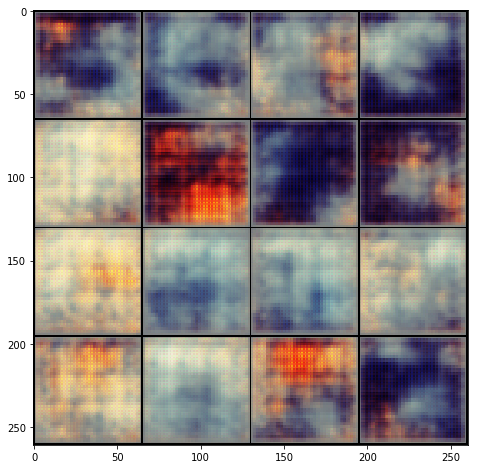

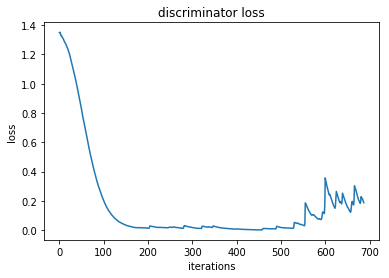

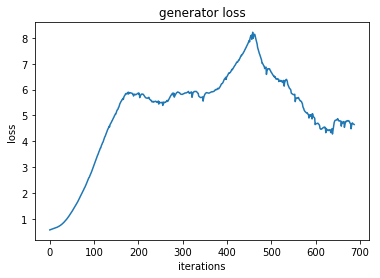

Iteration 700/17200: dis loss = 0.0437, gen loss = 4.1850, 2.05 sec
Iteration 750/17200: dis loss = 0.2886, gen loss = 2.2381, 1.70 sec
Iteration 800/17200: dis loss = 0.4775, gen loss = 4.0833, 1.69 sec
Iteration 850/17200: dis loss = 0.0444, gen loss = 4.1215, 1.69 sec
Iteration 900/17200: dis loss = 1.6348, gen loss = 6.8357, 1.69 sec
Iteration 950/17200: dis loss = 0.3161, gen loss = 2.3145, 1.70 sec
Iteration 1000/17200: dis loss = 0.0943, gen loss = 5.1255, 1.70 sec


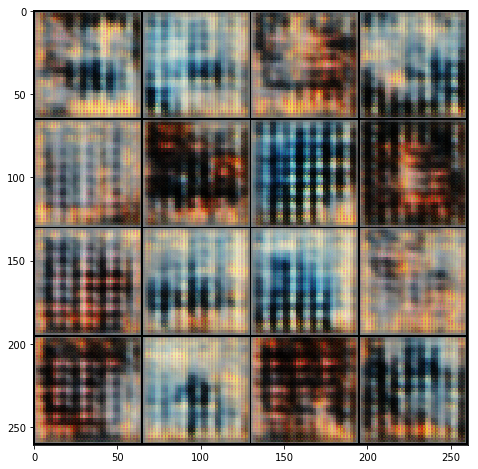

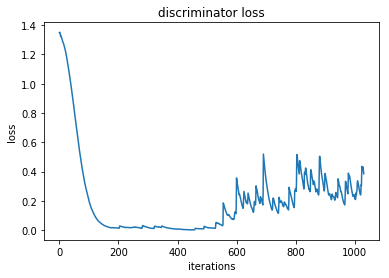

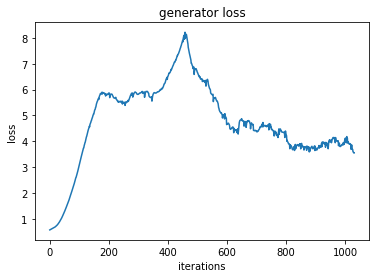

Iteration 1050/17200: dis loss = 0.0868, gen loss = 3.6382, 2.00 sec
Iteration 1100/17200: dis loss = 0.0936, gen loss = 3.2641, 1.71 sec
Iteration 1150/17200: dis loss = 0.2070, gen loss = 2.9964, 1.73 sec
Iteration 1200/17200: dis loss = 0.4021, gen loss = 2.2652, 1.76 sec
Iteration 1250/17200: dis loss = 0.5701, gen loss = 2.3896, 1.76 sec
Iteration 1300/17200: dis loss = 0.2254, gen loss = 3.1247, 1.71 sec
Iteration 1350/17200: dis loss = 0.6034, gen loss = 1.9980, 1.74 sec


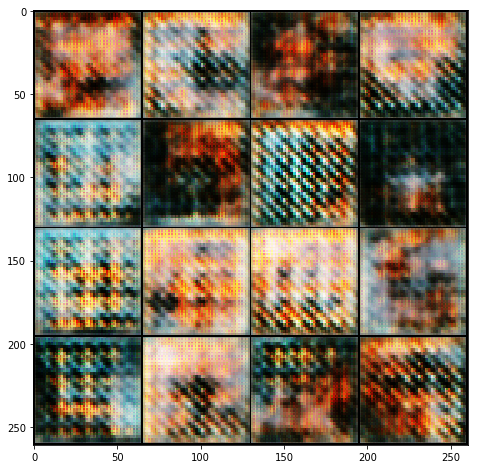

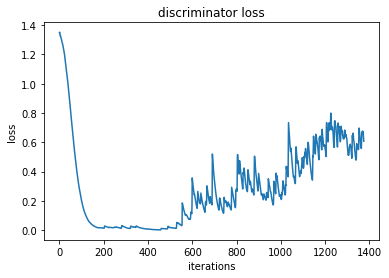

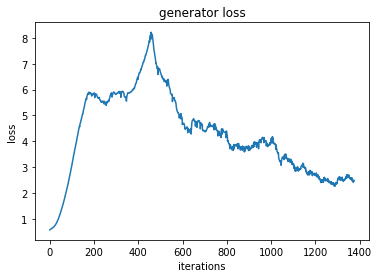

Iteration 1400/17200: dis loss = 0.3815, gen loss = 3.2911, 2.05 sec
Iteration 1450/17200: dis loss = 0.7662, gen loss = 4.0930, 1.76 sec
Iteration 1500/17200: dis loss = 0.1133, gen loss = 3.4831, 1.73 sec
Iteration 1550/17200: dis loss = 0.7746, gen loss = 1.7839, 1.73 sec
Iteration 1600/17200: dis loss = 0.1188, gen loss = 3.8333, 1.70 sec
Iteration 1650/17200: dis loss = 0.1361, gen loss = 3.1601, 1.75 sec
Iteration 1700/17200: dis loss = 0.4484, gen loss = 2.8482, 1.71 sec


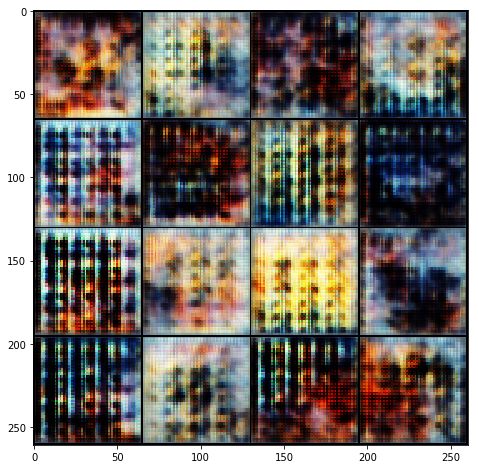

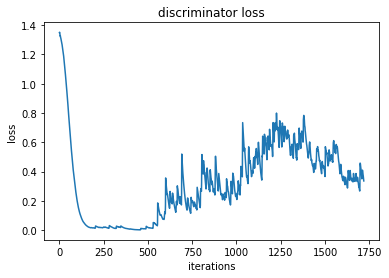

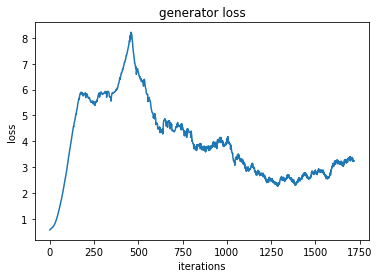

Iteration 1750/17200: dis loss = 0.0790, gen loss = 3.6250, 2.05 sec
Iteration 1800/17200: dis loss = 0.2482, gen loss = 1.4343, 1.74 sec
Iteration 1850/17200: dis loss = 0.3197, gen loss = 3.4967, 1.72 sec
Iteration 1900/17200: dis loss = 0.2397, gen loss = 4.6432, 1.78 sec
Iteration 1950/17200: dis loss = 0.1240, gen loss = 4.1416, 1.71 sec
Iteration 2000/17200: dis loss = 0.3989, gen loss = 1.9616, 1.72 sec
Iteration 2050/17200: dis loss = 0.1618, gen loss = 3.2850, 1.77 sec


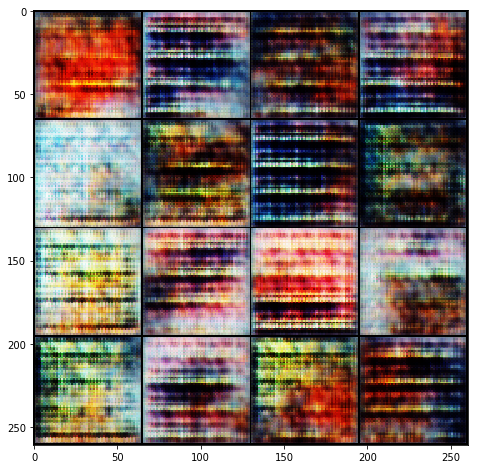

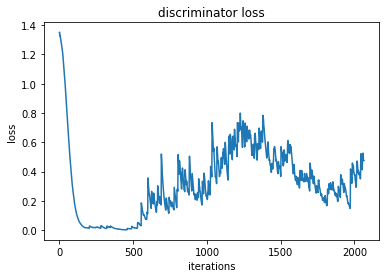

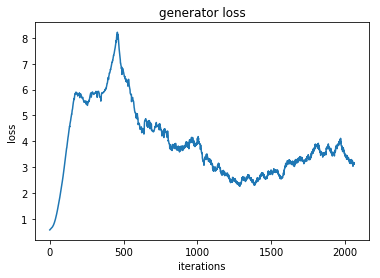

Iteration 2100/17200: dis loss = 0.1332, gen loss = 4.0129, 2.10 sec
Iteration 2150/17200: dis loss = 0.6245, gen loss = 1.2396, 1.72 sec
Iteration 2200/17200: dis loss = 0.4950, gen loss = 2.8551, 1.75 sec
Iteration 2250/17200: dis loss = 0.4854, gen loss = 2.1517, 1.73 sec
Iteration 2300/17200: dis loss = 0.4439, gen loss = 2.2671, 1.76 sec
Iteration 2350/17200: dis loss = 0.3245, gen loss = 3.3888, 1.78 sec
Iteration 2400/17200: dis loss = 0.5451, gen loss = 1.7898, 1.77 sec


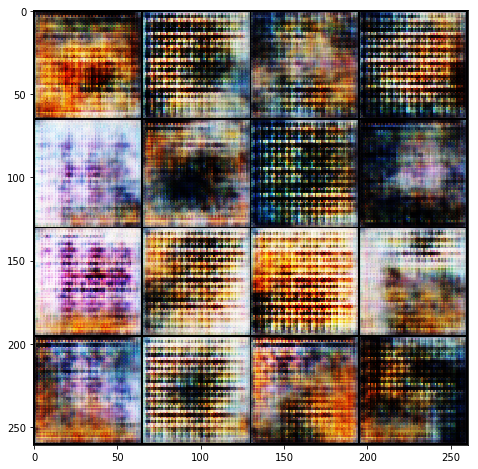

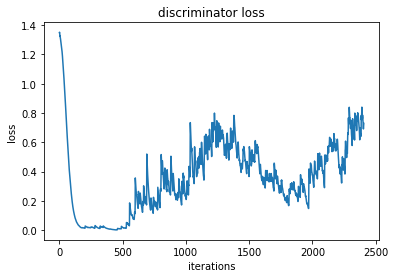

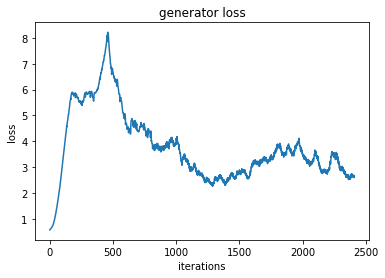

Iteration 2450/17200: dis loss = 0.5092, gen loss = 2.2269, 2.06 sec
Iteration 2500/17200: dis loss = 0.4329, gen loss = 3.2597, 1.76 sec
Iteration 2550/17200: dis loss = 0.3163, gen loss = 3.2840, 1.79 sec
Iteration 2600/17200: dis loss = 1.9954, gen loss = 4.5805, 1.77 sec
Iteration 2650/17200: dis loss = 0.2969, gen loss = 2.7768, 1.76 sec
Iteration 2700/17200: dis loss = 1.0757, gen loss = 3.4254, 1.73 sec
Iteration 2750/17200: dis loss = 0.8328, gen loss = 1.3545, 1.72 sec


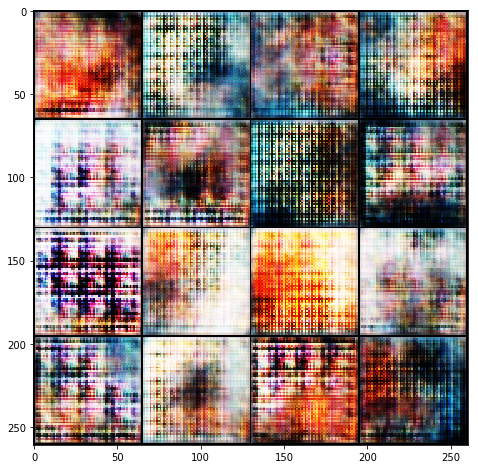

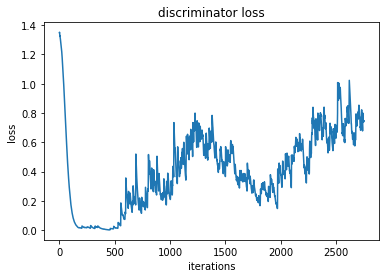

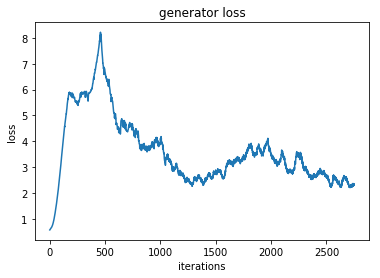

Iteration 2800/17200: dis loss = 0.4814, gen loss = 1.6769, 2.05 sec
Iteration 2850/17200: dis loss = 0.2829, gen loss = 2.6478, 1.72 sec
Iteration 2900/17200: dis loss = 0.5429, gen loss = 2.7784, 1.69 sec
Iteration 2950/17200: dis loss = 0.3898, gen loss = 2.2211, 1.77 sec
Iteration 3000/17200: dis loss = 0.3364, gen loss = 2.6689, 1.76 sec
Iteration 3050/17200: dis loss = 1.0243, gen loss = 3.3616, 1.78 sec


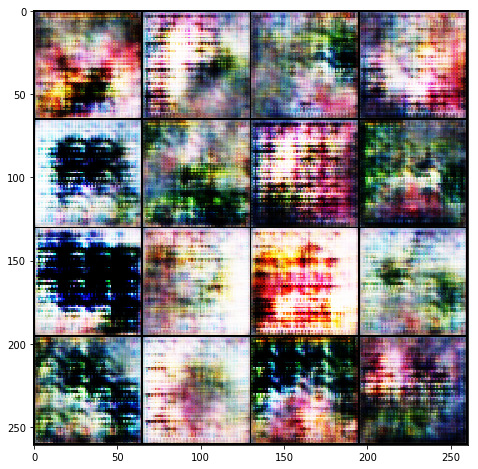

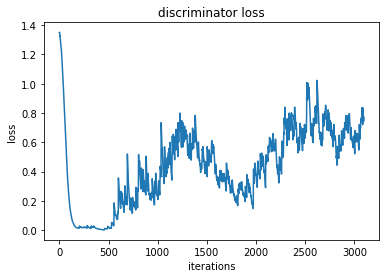

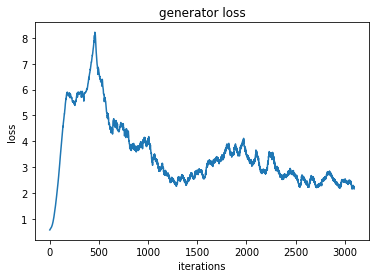

Iteration 3100/17200: dis loss = 0.6062, gen loss = 1.5105, 2.03 sec
Iteration 3150/17200: dis loss = 0.4139, gen loss = 1.7673, 1.73 sec
Iteration 3200/17200: dis loss = 0.3673, gen loss = 2.0568, 1.73 sec
Iteration 3250/17200: dis loss = 0.7718, gen loss = 0.9300, 1.76 sec
Iteration 3300/17200: dis loss = 0.4882, gen loss = 1.6649, 1.79 sec
Iteration 3350/17200: dis loss = 1.7772, gen loss = 4.2151, 1.76 sec
Iteration 3400/17200: dis loss = 0.5200, gen loss = 2.3553, 1.70 sec


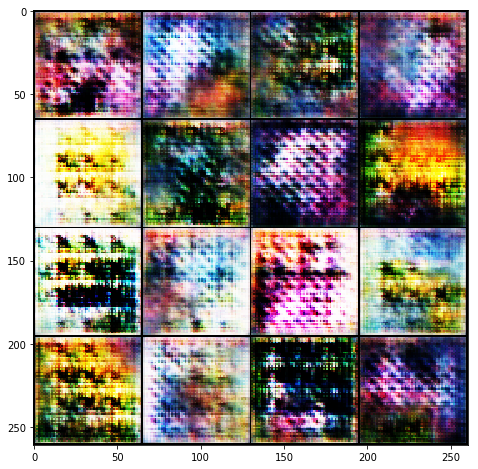

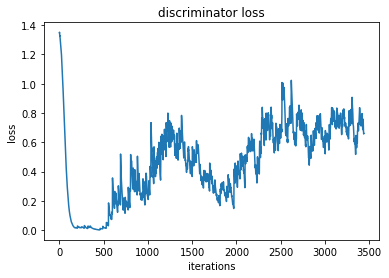

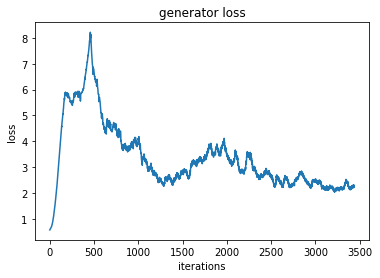

Iteration 3450/17200: dis loss = 0.9704, gen loss = 3.2373, 2.03 sec
Iteration 3500/17200: dis loss = 0.7974, gen loss = 1.2314, 1.77 sec
Iteration 3550/17200: dis loss = 0.5376, gen loss = 1.8302, 1.71 sec
Iteration 3600/17200: dis loss = 0.6837, gen loss = 3.5688, 1.72 sec
Iteration 3650/17200: dis loss = 0.9135, gen loss = 2.6396, 1.74 sec
Iteration 3700/17200: dis loss = 0.4432, gen loss = 2.0356, 1.75 sec
Iteration 3750/17200: dis loss = 0.6408, gen loss = 2.2767, 1.72 sec


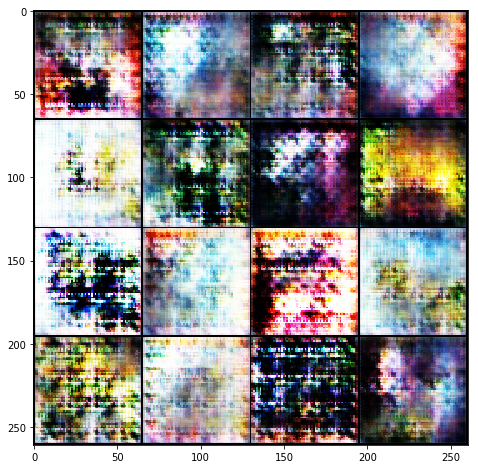

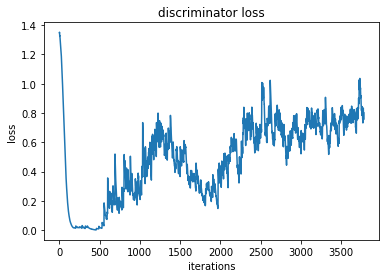

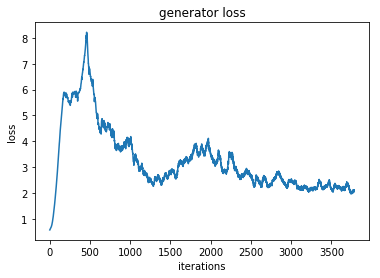

Iteration 3800/17200: dis loss = 0.6356, gen loss = 1.8880, 2.15 sec
Iteration 3850/17200: dis loss = 0.7285, gen loss = 0.8044, 1.73 sec
Iteration 3900/17200: dis loss = 0.4833, gen loss = 3.0201, 1.73 sec
Iteration 3950/17200: dis loss = 0.2455, gen loss = 2.9593, 1.75 sec
Iteration 4000/17200: dis loss = 0.5522, gen loss = 2.1513, 1.76 sec
Iteration 4050/17200: dis loss = 0.6313, gen loss = 1.4435, 1.78 sec
Iteration 4100/17200: dis loss = 0.8198, gen loss = 0.3948, 1.78 sec


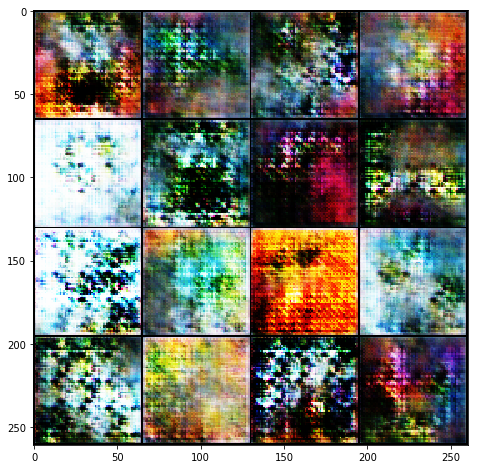

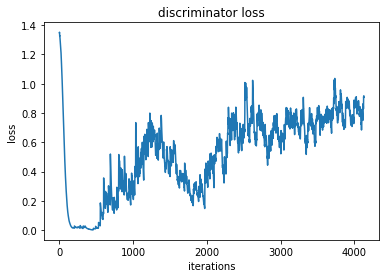

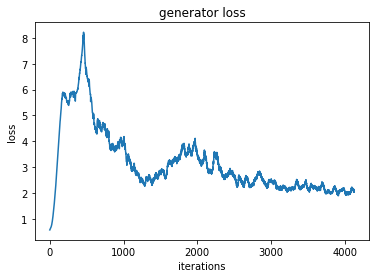

Iteration 4150/17200: dis loss = 1.2988, gen loss = 1.2233, 2.06 sec
Iteration 4200/17200: dis loss = 0.7904, gen loss = 2.3275, 1.77 sec
Iteration 4250/17200: dis loss = 1.1051, gen loss = 1.4707, 1.75 sec
Iteration 4300/17200: dis loss = 1.3020, gen loss = 0.7135, 1.78 sec
Iteration 4350/17200: dis loss = 1.3847, gen loss = 0.5588, 1.74 sec
Iteration 4400/17200: dis loss = 1.3880, gen loss = 0.6504, 1.73 sec
Iteration 4450/17200: dis loss = 1.5441, gen loss = 0.5641, 1.76 sec


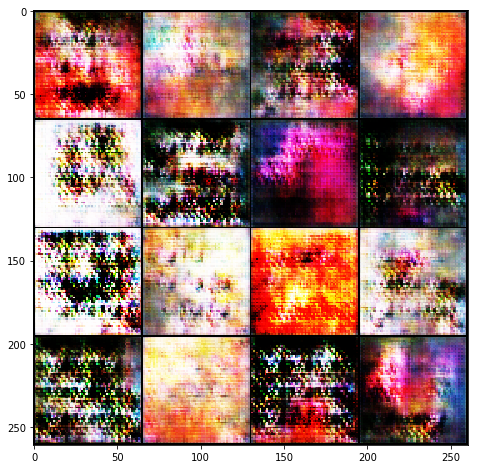

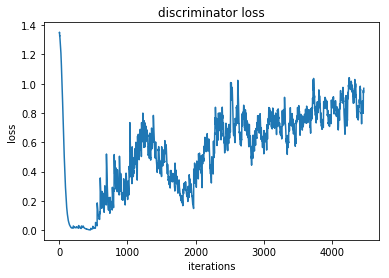

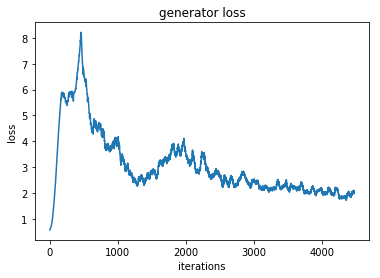

Iteration 4500/17200: dis loss = 0.6468, gen loss = 1.4423, 2.05 sec
Iteration 4550/17200: dis loss = 1.1226, gen loss = 2.8968, 1.72 sec
Iteration 4600/17200: dis loss = 1.3213, gen loss = 3.6895, 1.72 sec
Iteration 4650/17200: dis loss = 1.6078, gen loss = 2.9512, 1.72 sec
Iteration 4700/17200: dis loss = 0.7165, gen loss = 1.3770, 1.69 sec
Iteration 4750/17200: dis loss = 1.7124, gen loss = 0.4622, 1.72 sec
Iteration 4800/17200: dis loss = 0.6770, gen loss = 1.8654, 1.69 sec


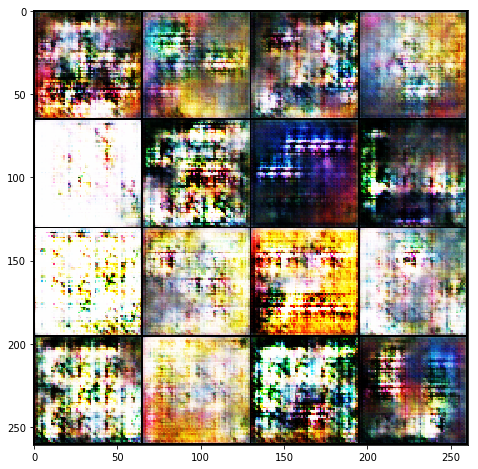

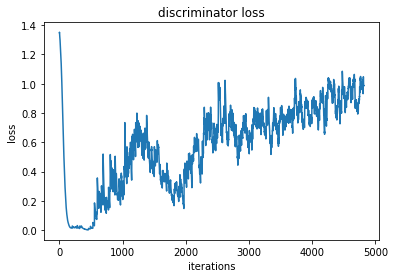

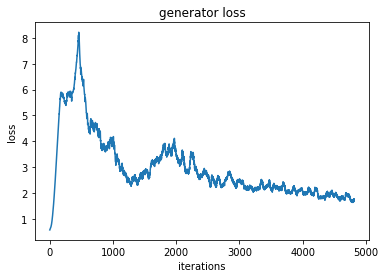

Iteration 4850/17200: dis loss = 0.7743, gen loss = 1.2917, 2.03 sec
Iteration 4900/17200: dis loss = 0.7652, gen loss = 2.2290, 1.69 sec
Iteration 4950/17200: dis loss = 1.0203, gen loss = 1.0133, 1.71 sec
Iteration 5000/17200: dis loss = 0.9063, gen loss = 2.4227, 1.75 sec
Iteration 5050/17200: dis loss = 0.4395, gen loss = 2.2166, 1.71 sec
Iteration 5100/17200: dis loss = 0.8241, gen loss = 0.7538, 1.72 sec
Iteration 5150/17200: dis loss = 1.7983, gen loss = 0.3526, 1.69 sec


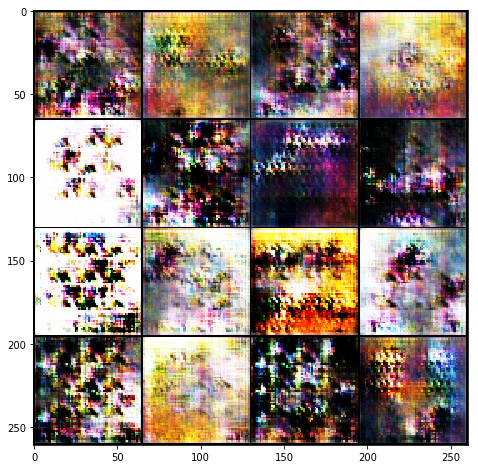

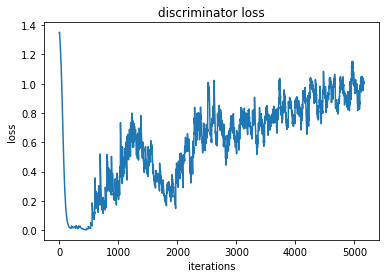

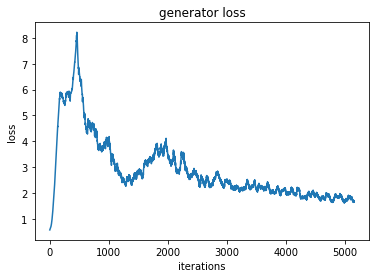

Iteration 5200/17200: dis loss = 0.9143, gen loss = 1.2431, 2.03 sec
Iteration 5250/17200: dis loss = 0.8388, gen loss = 0.9576, 1.72 sec
Iteration 5300/17200: dis loss = 1.1091, gen loss = 1.2386, 1.70 sec
Iteration 5350/17200: dis loss = 0.2501, gen loss = 2.5181, 1.73 sec
Iteration 5400/17200: dis loss = 0.3889, gen loss = 2.6071, 1.72 sec
Iteration 5450/17200: dis loss = 0.8934, gen loss = 2.3076, 1.69 sec
Iteration 5500/17200: dis loss = 1.0687, gen loss = 1.1304, 1.68 sec


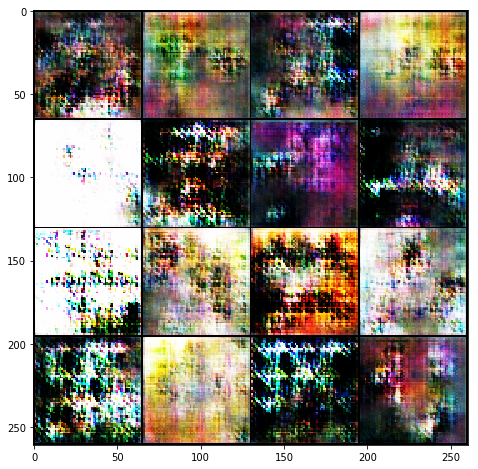

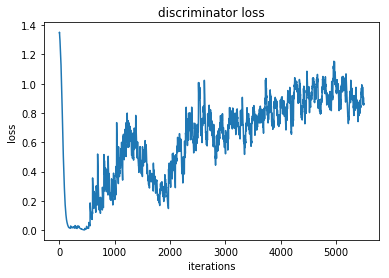

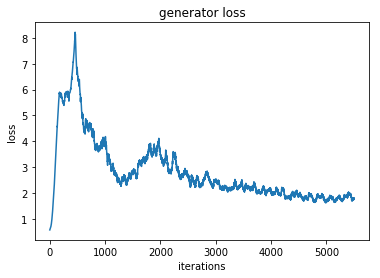

Iteration 5550/17200: dis loss = 1.5628, gen loss = 2.6051, 2.34 sec
Iteration 5600/17200: dis loss = 0.5872, gen loss = 1.3336, 1.72 sec
Iteration 5650/17200: dis loss = 0.6831, gen loss = 1.5679, 1.70 sec
Iteration 5700/17200: dis loss = 1.0180, gen loss = 1.9870, 1.73 sec
Iteration 5750/17200: dis loss = 0.3148, gen loss = 2.3903, 1.73 sec
Iteration 5800/17200: dis loss = 0.5925, gen loss = 1.6889, 1.72 sec


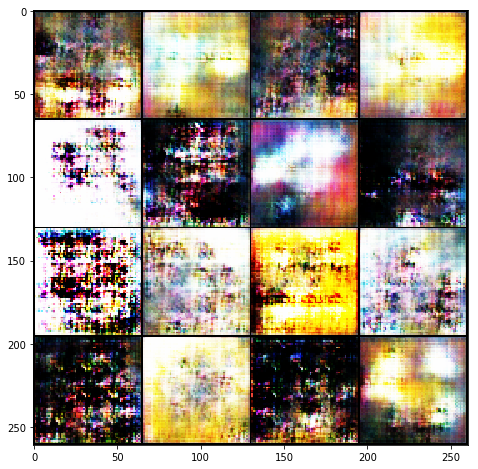

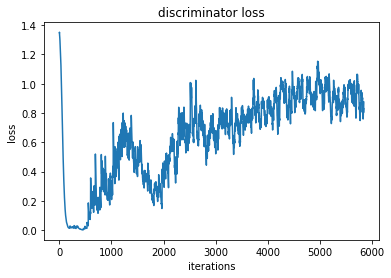

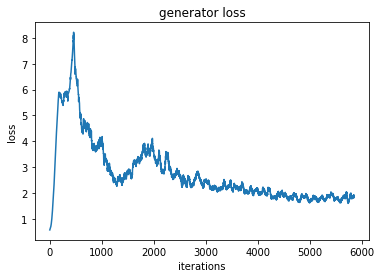

Iteration 5850/17200: dis loss = 0.8725, gen loss = 1.0103, 2.06 sec
Iteration 5900/17200: dis loss = 0.6738, gen loss = 1.6335, 1.73 sec
Iteration 5950/17200: dis loss = 0.6582, gen loss = 2.2316, 1.77 sec
Iteration 6000/17200: dis loss = 0.8260, gen loss = 1.4454, 1.73 sec
Iteration 6050/17200: dis loss = 0.5335, gen loss = 2.6227, 1.77 sec
Iteration 6100/17200: dis loss = 0.9103, gen loss = 2.3953, 1.75 sec
Iteration 6150/17200: dis loss = 1.2722, gen loss = 0.9846, 1.75 sec


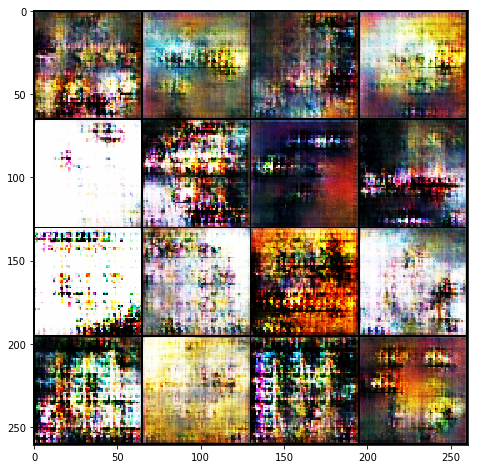

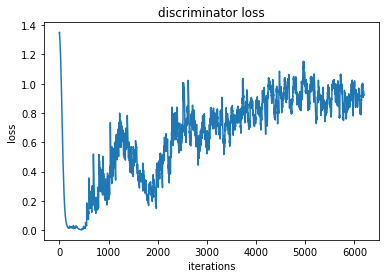

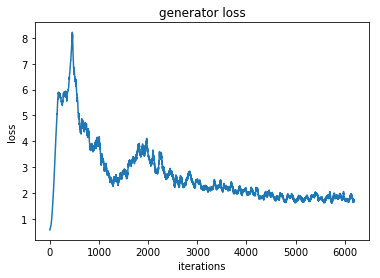

Iteration 6200/17200: dis loss = 0.4998, gen loss = 2.1693, 2.15 sec
Iteration 6250/17200: dis loss = 1.0918, gen loss = 1.6847, 1.74 sec
Iteration 6300/17200: dis loss = 0.8031, gen loss = 2.5602, 1.71 sec
Iteration 6350/17200: dis loss = 1.2999, gen loss = 1.4257, 1.71 sec
Iteration 6400/17200: dis loss = 0.2474, gen loss = 2.5025, 1.73 sec
Iteration 6450/17200: dis loss = 1.3666, gen loss = 3.6532, 1.73 sec
Iteration 6500/17200: dis loss = 0.6640, gen loss = 1.5718, 1.72 sec


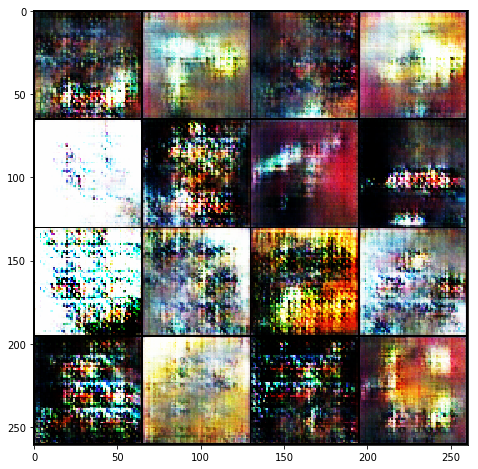

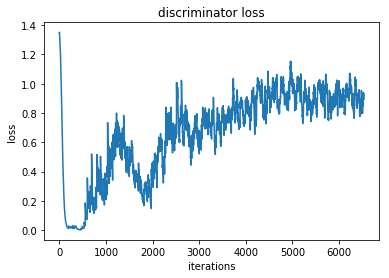

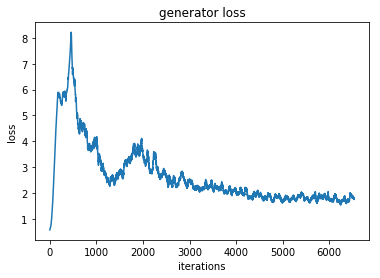

Iteration 6550/17200: dis loss = 0.6724, gen loss = 1.4817, 2.04 sec
Iteration 6600/17200: dis loss = 0.4731, gen loss = 2.1229, 1.69 sec
Iteration 6650/17200: dis loss = 0.7301, gen loss = 2.4933, 1.69 sec
Iteration 6700/17200: dis loss = 1.3602, gen loss = 0.6303, 1.72 sec
Iteration 6750/17200: dis loss = 0.9501, gen loss = 1.6072, 1.72 sec
Iteration 6800/17200: dis loss = 0.7365, gen loss = 1.7330, 1.73 sec
Iteration 6850/17200: dis loss = 0.7557, gen loss = 1.5495, 1.75 sec


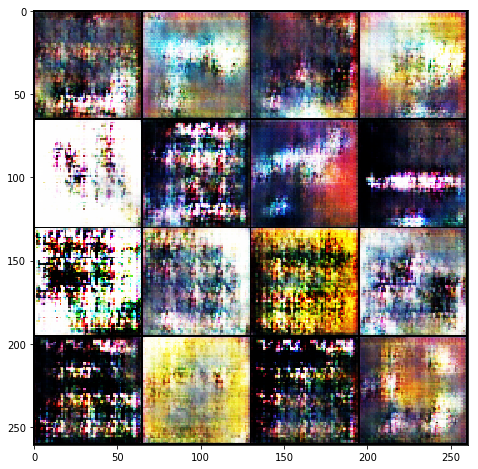

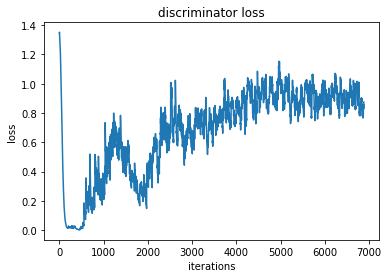

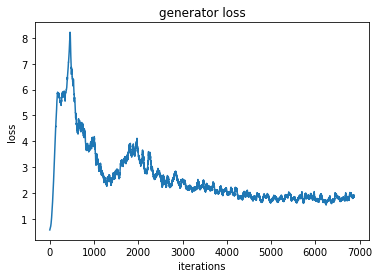

Iteration 6900/17200: dis loss = 0.7496, gen loss = 1.9372, 2.05 sec
Iteration 6950/17200: dis loss = 0.4979, gen loss = 1.6501, 1.69 sec
Iteration 7000/17200: dis loss = 0.6654, gen loss = 2.1485, 1.71 sec
Iteration 7050/17200: dis loss = 1.0629, gen loss = 1.2157, 1.71 sec
Iteration 7100/17200: dis loss = 0.8648, gen loss = 1.4846, 1.69 sec
Iteration 7150/17200: dis loss = 0.4865, gen loss = 1.8546, 1.70 sec
Iteration 7200/17200: dis loss = 0.8454, gen loss = 1.2320, 1.73 sec


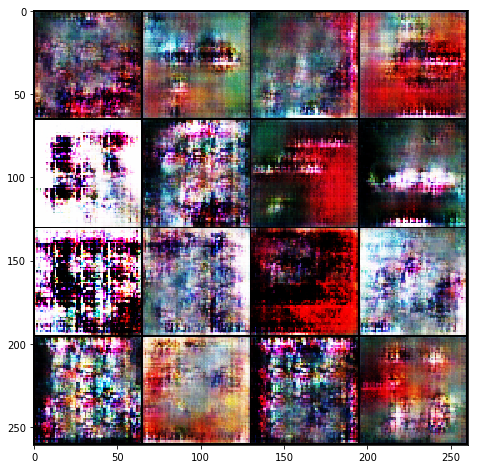

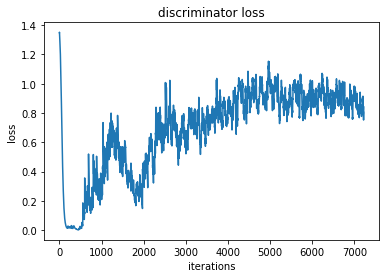

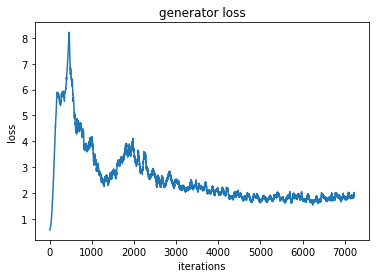

Iteration 7250/17200: dis loss = 0.8158, gen loss = 2.8704, 2.04 sec
Iteration 7300/17200: dis loss = 0.4907, gen loss = 2.3712, 1.71 sec
Iteration 7350/17200: dis loss = 1.3198, gen loss = 0.9083, 1.70 sec
Iteration 7400/17200: dis loss = 0.5702, gen loss = 1.8182, 1.68 sec
Iteration 7450/17200: dis loss = 0.7506, gen loss = 1.3423, 1.72 sec
Iteration 7500/17200: dis loss = 0.9349, gen loss = 0.1726, 1.70 sec
Iteration 7550/17200: dis loss = 0.5920, gen loss = 1.7199, 1.68 sec


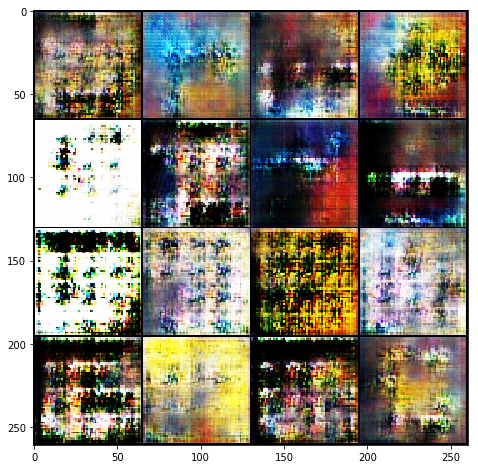

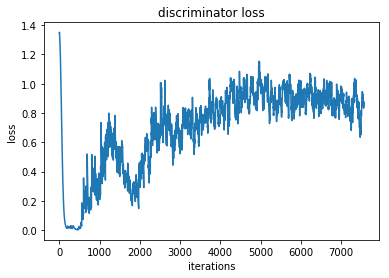

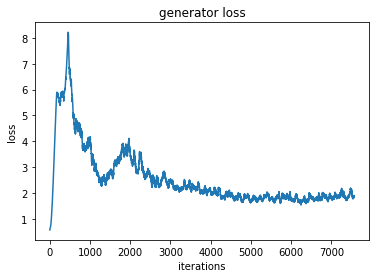

Iteration 7600/17200: dis loss = 0.8450, gen loss = 1.4739, 2.04 sec
Iteration 7650/17200: dis loss = 0.4692, gen loss = 2.4260, 1.74 sec
Iteration 7700/17200: dis loss = 1.4314, gen loss = 0.5705, 1.73 sec
Iteration 7750/17200: dis loss = 0.9012, gen loss = 3.1360, 1.74 sec
Iteration 7800/17200: dis loss = 0.7042, gen loss = 1.4749, 1.72 sec
Iteration 7850/17200: dis loss = 0.5164, gen loss = 2.0319, 1.81 sec
Iteration 7900/17200: dis loss = 0.5189, gen loss = 1.2932, 1.73 sec


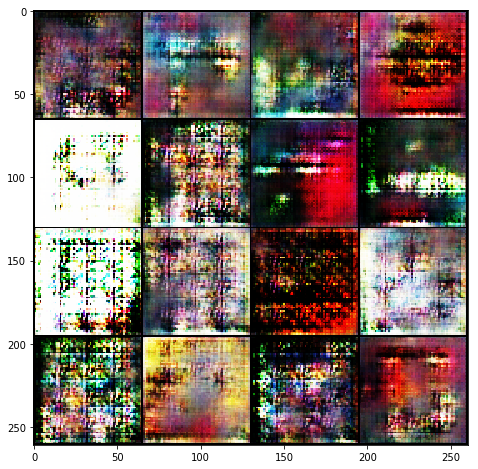

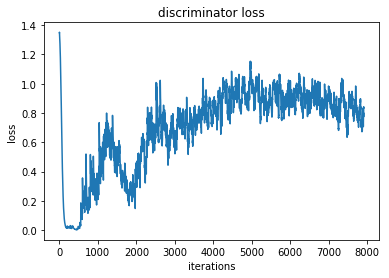

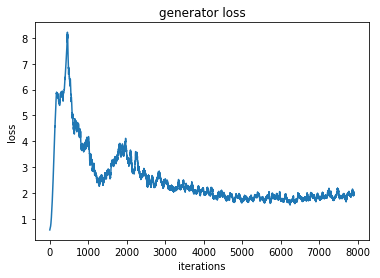

Iteration 7950/17200: dis loss = 0.8132, gen loss = 3.1234, 2.14 sec
Iteration 8000/17200: dis loss = 1.0152, gen loss = 3.8586, 1.79 sec
Iteration 8050/17200: dis loss = 1.2032, gen loss = 0.9378, 1.75 sec
Iteration 8100/17200: dis loss = 0.3697, gen loss = 2.3032, 1.77 sec
Iteration 8150/17200: dis loss = 1.0142, gen loss = 0.7569, 1.79 sec
Iteration 8200/17200: dis loss = 1.4234, gen loss = 3.0625, 1.81 sec
Iteration 8250/17200: dis loss = 0.4032, gen loss = 2.9745, 1.77 sec


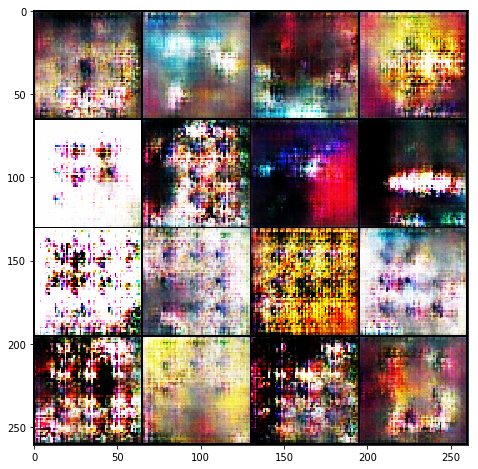

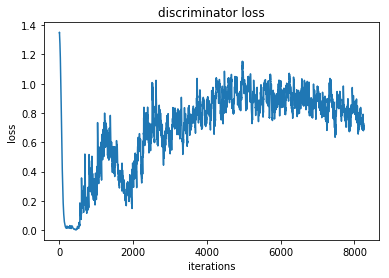

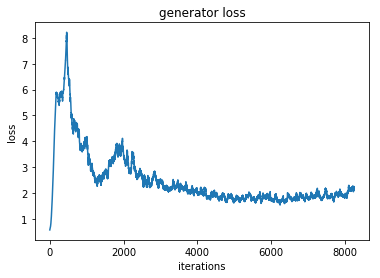

Iteration 8300/17200: dis loss = 0.6617, gen loss = 1.8633, 2.10 sec
Iteration 8350/17200: dis loss = 0.4242, gen loss = 2.4269, 1.76 sec
Iteration 8400/17200: dis loss = 0.6377, gen loss = 1.1504, 1.78 sec
Iteration 8450/17200: dis loss = 0.5029, gen loss = 2.5478, 1.72 sec
Iteration 8500/17200: dis loss = 0.6431, gen loss = 1.8698, 1.74 sec
Iteration 8550/17200: dis loss = 0.6645, gen loss = 2.3601, 1.74 sec
Iteration 8600/17200: dis loss = 0.5307, gen loss = 1.8668, 1.70 sec


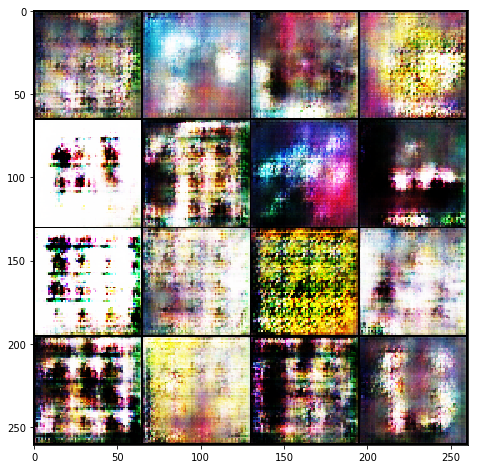

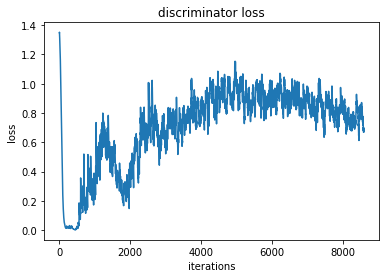

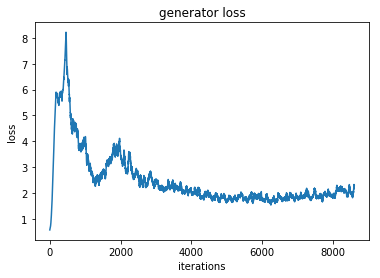

Iteration 8650/17200: dis loss = 1.0267, gen loss = 1.0857, 2.04 sec
Iteration 8700/17200: dis loss = 0.4034, gen loss = 2.5159, 1.77 sec
Iteration 8750/17200: dis loss = 0.9338, gen loss = 1.2030, 1.75 sec
Iteration 8800/17200: dis loss = 0.5425, gen loss = 2.3769, 1.77 sec
Iteration 8850/17200: dis loss = 0.8182, gen loss = 2.7111, 1.70 sec
Iteration 8900/17200: dis loss = 1.1963, gen loss = 4.0160, 1.73 sec


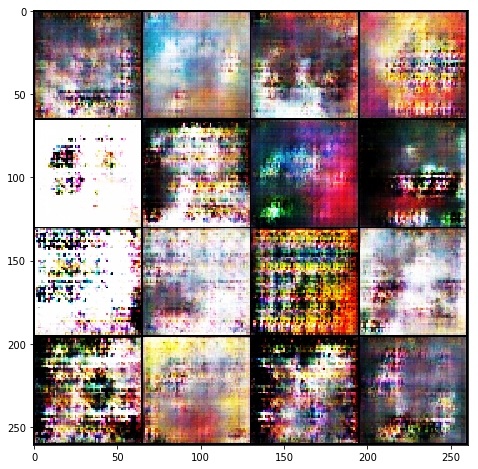

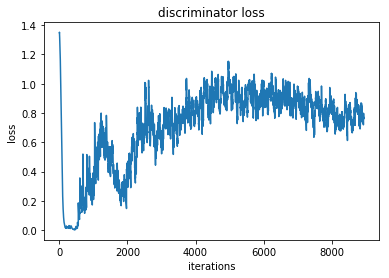

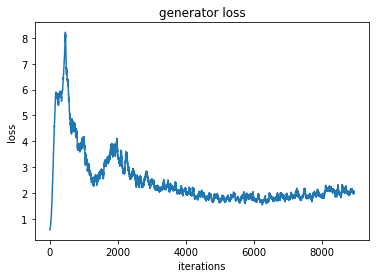

Iteration 8950/17200: dis loss = 0.6615, gen loss = 0.8914, 2.03 sec
Iteration 9000/17200: dis loss = 0.8007, gen loss = 2.4475, 1.72 sec
Iteration 9050/17200: dis loss = 0.9097, gen loss = 3.1258, 1.70 sec
Iteration 9100/17200: dis loss = 0.4652, gen loss = 2.0615, 1.72 sec
Iteration 9150/17200: dis loss = 0.7283, gen loss = 3.0929, 1.71 sec
Iteration 9200/17200: dis loss = 0.6074, gen loss = 1.6618, 1.70 sec
Iteration 9250/17200: dis loss = 0.6231, gen loss = 2.7303, 1.71 sec


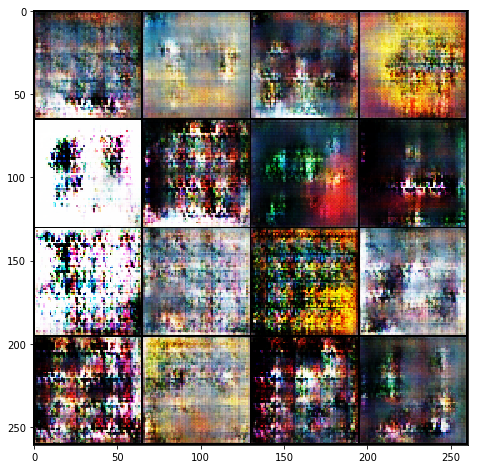

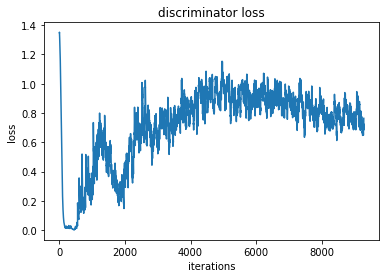

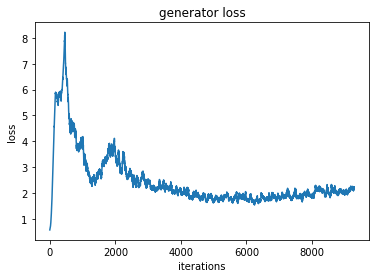

Iteration 9300/17200: dis loss = 0.8226, gen loss = 1.9370, 2.08 sec
Iteration 9350/17200: dis loss = 0.8190, gen loss = 1.0301, 1.75 sec
Iteration 9400/17200: dis loss = 0.9617, gen loss = 2.9489, 1.74 sec
Iteration 9450/17200: dis loss = 0.7465, gen loss = 2.9975, 1.76 sec
Iteration 9500/17200: dis loss = 0.6339, gen loss = 2.9784, 1.75 sec
Iteration 9550/17200: dis loss = 1.6936, gen loss = 0.9892, 1.75 sec
Iteration 9600/17200: dis loss = 0.6484, gen loss = 1.4265, 1.72 sec


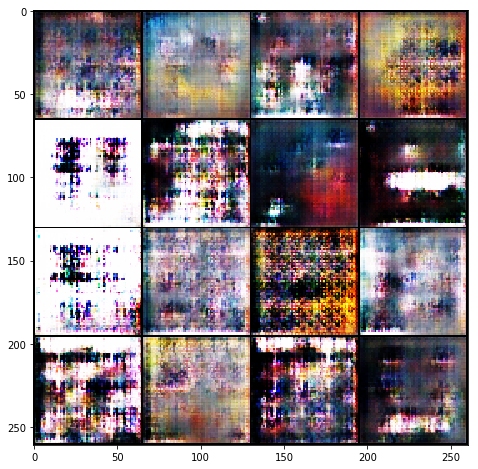

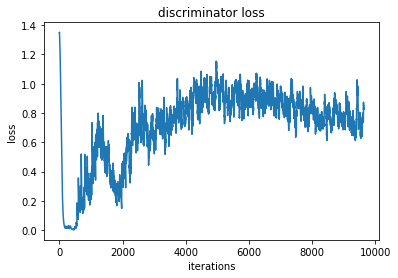

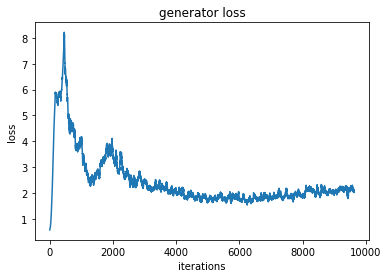

Iteration 9650/17200: dis loss = 0.7485, gen loss = 3.3231, 2.06 sec
Iteration 9700/17200: dis loss = 1.1022, gen loss = 0.5574, 1.71 sec
Iteration 9750/17200: dis loss = 0.4302, gen loss = 2.9922, 1.78 sec
Iteration 9800/17200: dis loss = 0.8693, gen loss = 0.8737, 1.76 sec
Iteration 9850/17200: dis loss = 0.7042, gen loss = 2.0882, 1.75 sec
Iteration 9900/17200: dis loss = 0.4855, gen loss = 2.0560, 1.74 sec
Iteration 9950/17200: dis loss = 1.2728, gen loss = 1.0116, 1.79 sec


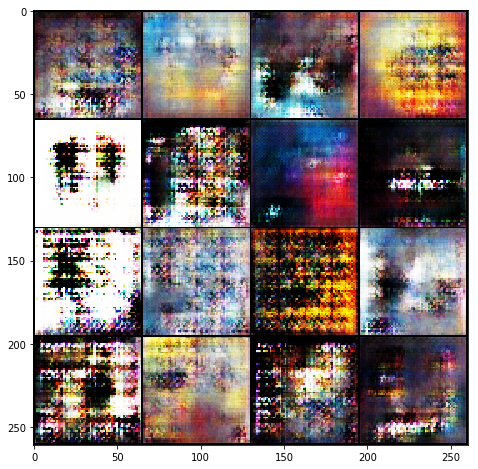

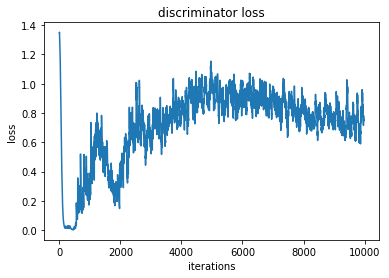

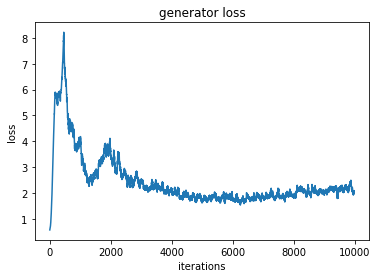

Iteration 10000/17200: dis loss = 0.6350, gen loss = 2.1035, 2.07 sec
Iteration 10050/17200: dis loss = 0.7494, gen loss = 3.3680, 1.74 sec
Iteration 10100/17200: dis loss = 0.6053, gen loss = 1.5635, 1.73 sec
Iteration 10150/17200: dis loss = 0.9413, gen loss = 2.2093, 1.76 sec
Iteration 10200/17200: dis loss = 0.5773, gen loss = 1.9796, 1.79 sec
Iteration 10250/17200: dis loss = 0.9892, gen loss = 1.2333, 1.74 sec
Iteration 10300/17200: dis loss = 0.9968, gen loss = 0.9291, 1.73 sec


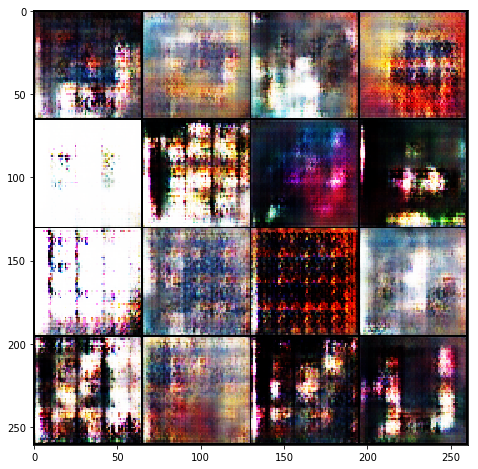

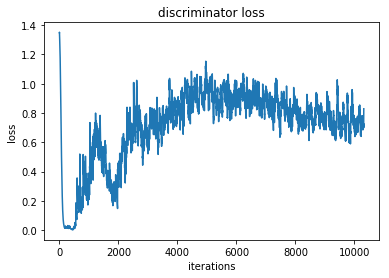

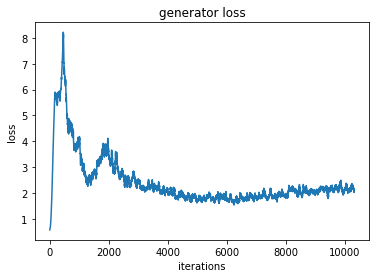

Iteration 10350/17200: dis loss = 0.2835, gen loss = 2.4810, 2.04 sec
Iteration 10400/17200: dis loss = 0.5959, gen loss = 1.1190, 1.70 sec
Iteration 10450/17200: dis loss = 0.9666, gen loss = 1.3934, 1.75 sec
Iteration 10500/17200: dis loss = 0.9286, gen loss = 2.1962, 1.69 sec
Iteration 10550/17200: dis loss = 0.4046, gen loss = 2.1996, 1.71 sec
Iteration 10600/17200: dis loss = 0.3471, gen loss = 2.6798, 1.70 sec
Iteration 10650/17200: dis loss = 0.4973, gen loss = 2.4636, 1.71 sec


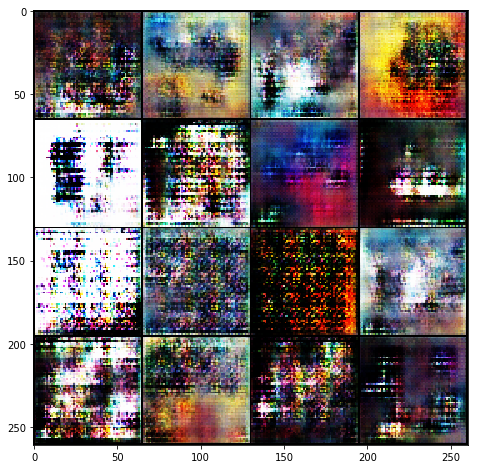

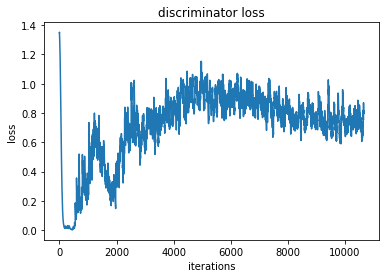

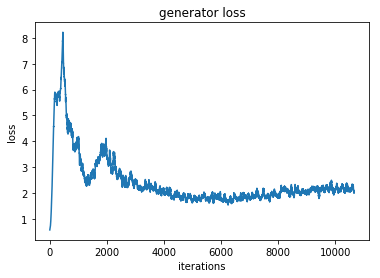

Iteration 10700/17200: dis loss = 0.8884, gen loss = 1.3084, 2.03 sec
Iteration 10750/17200: dis loss = 0.9019, gen loss = 0.4271, 1.69 sec
Iteration 10800/17200: dis loss = 0.5740, gen loss = 1.7799, 1.71 sec
Iteration 10850/17200: dis loss = 0.9837, gen loss = 3.1714, 1.72 sec
Iteration 10900/17200: dis loss = 0.5620, gen loss = 2.4599, 1.71 sec
Iteration 10950/17200: dis loss = 0.2678, gen loss = 2.9400, 1.73 sec
Iteration 11000/17200: dis loss = 0.7291, gen loss = 1.4087, 1.70 sec


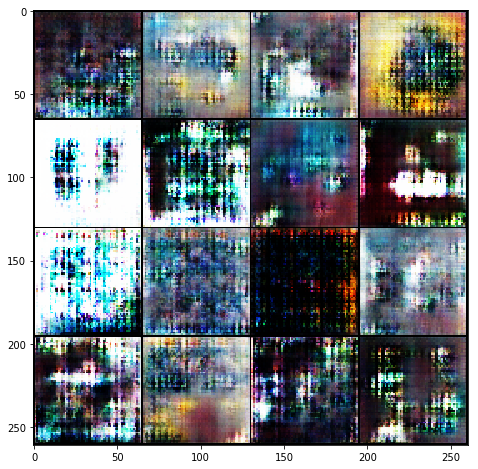

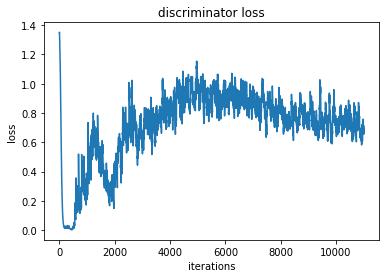

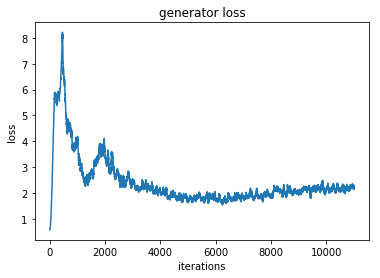

Iteration 11050/17200: dis loss = 0.6919, gen loss = 1.4738, 2.01 sec
Iteration 11100/17200: dis loss = 0.5320, gen loss = 2.0379, 1.71 sec
Iteration 11150/17200: dis loss = 0.6727, gen loss = 1.4297, 1.71 sec
Iteration 11200/17200: dis loss = 0.9124, gen loss = 3.0406, 1.71 sec
Iteration 11250/17200: dis loss = 0.9729, gen loss = 2.9197, 1.70 sec
Iteration 11300/17200: dis loss = 1.0265, gen loss = 3.9516, 1.70 sec
Iteration 11350/17200: dis loss = 1.1449, gen loss = 0.6841, 1.71 sec


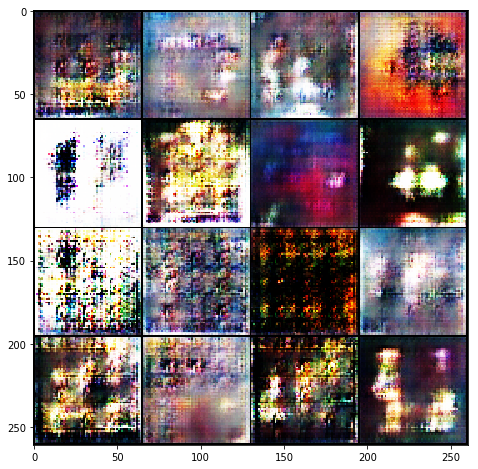

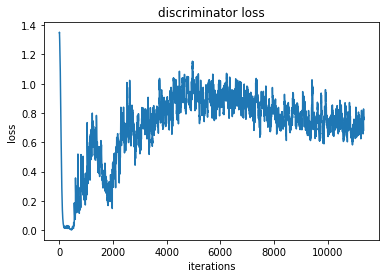

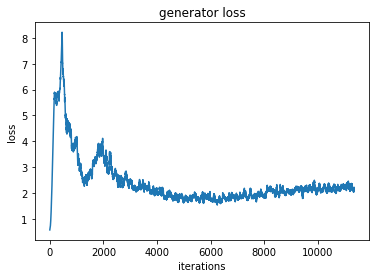

Iteration 11400/17200: dis loss = 1.1250, gen loss = 1.2104, 2.11 sec
Iteration 11450/17200: dis loss = 0.3202, gen loss = 2.3869, 1.72 sec
Iteration 11500/17200: dis loss = 0.6171, gen loss = 1.5617, 1.69 sec
Iteration 11550/17200: dis loss = 0.5105, gen loss = 2.7130, 1.70 sec
Iteration 11600/17200: dis loss = 0.4820, gen loss = 2.3171, 1.72 sec
Iteration 11650/17200: dis loss = 0.6052, gen loss = 2.4198, 1.69 sec


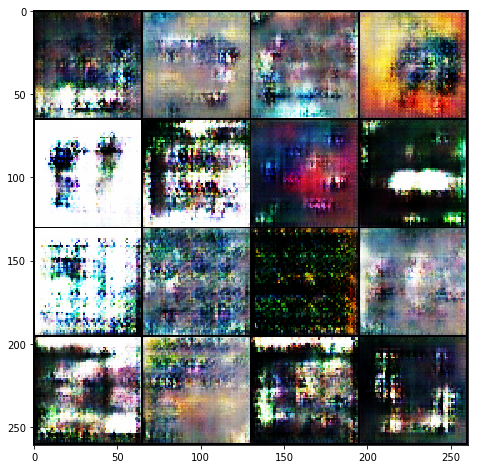

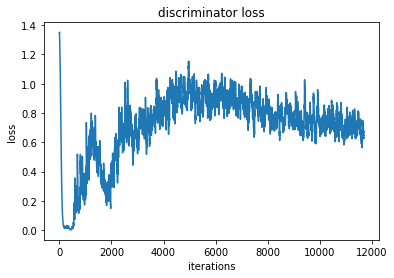

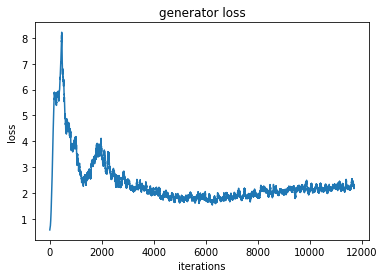

Iteration 11700/17200: dis loss = 0.6490, gen loss = 2.9449, 2.07 sec
Iteration 11750/17200: dis loss = 0.3599, gen loss = 2.7121, 1.72 sec
Iteration 11800/17200: dis loss = 0.4344, gen loss = 2.8804, 1.72 sec
Iteration 11850/17200: dis loss = 1.3947, gen loss = 0.1674, 1.70 sec
Iteration 11900/17200: dis loss = 0.4374, gen loss = 3.7553, 1.71 sec
Iteration 11950/17200: dis loss = 0.6690, gen loss = 2.5731, 1.73 sec
Iteration 12000/17200: dis loss = 1.0349, gen loss = 3.9875, 1.70 sec


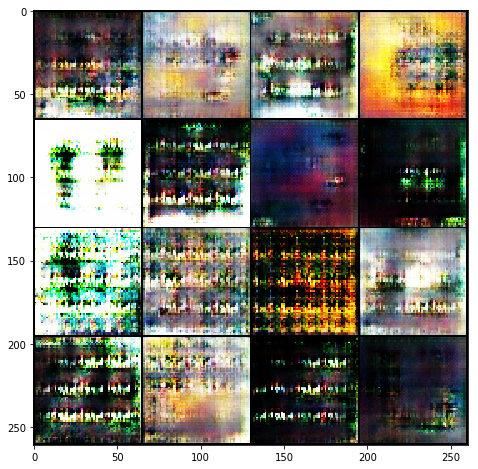

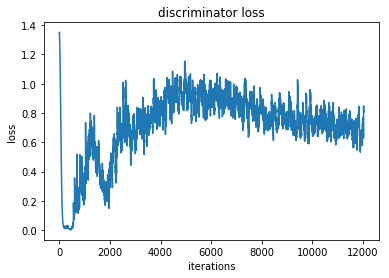

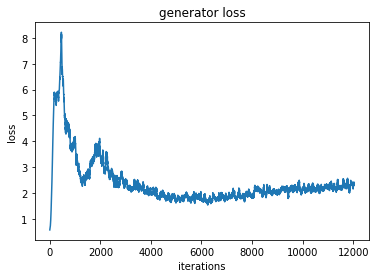

Iteration 12050/17200: dis loss = 0.3605, gen loss = 2.3320, 2.05 sec
Iteration 12100/17200: dis loss = 0.6805, gen loss = 1.1262, 1.71 sec
Iteration 12150/17200: dis loss = 0.8761, gen loss = 3.1275, 1.73 sec
Iteration 12200/17200: dis loss = 0.3497, gen loss = 3.2042, 1.73 sec
Iteration 12250/17200: dis loss = 0.7875, gen loss = 3.0569, 1.71 sec
Iteration 12300/17200: dis loss = 1.2380, gen loss = 1.3875, 1.75 sec
Iteration 12350/17200: dis loss = 0.6082, gen loss = 0.5166, 1.72 sec


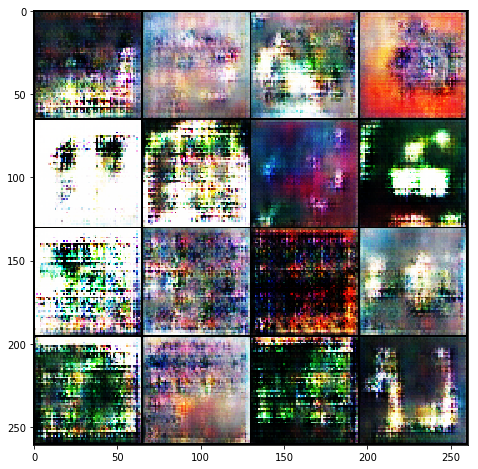

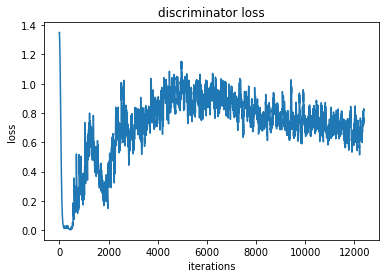

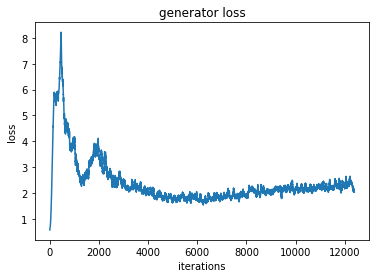

Iteration 12400/17200: dis loss = 0.4303, gen loss = 2.2076, 2.04 sec
Iteration 12450/17200: dis loss = 0.3744, gen loss = 2.1340, 1.73 sec
Iteration 12500/17200: dis loss = 1.0363, gen loss = 3.3704, 1.78 sec
Iteration 12550/17200: dis loss = 0.8736, gen loss = 2.7606, 1.71 sec
Iteration 12600/17200: dis loss = 0.3825, gen loss = 2.0665, 1.73 sec
Iteration 12650/17200: dis loss = 0.6975, gen loss = 2.7370, 1.73 sec
Iteration 12700/17200: dis loss = 0.2959, gen loss = 2.1497, 1.71 sec


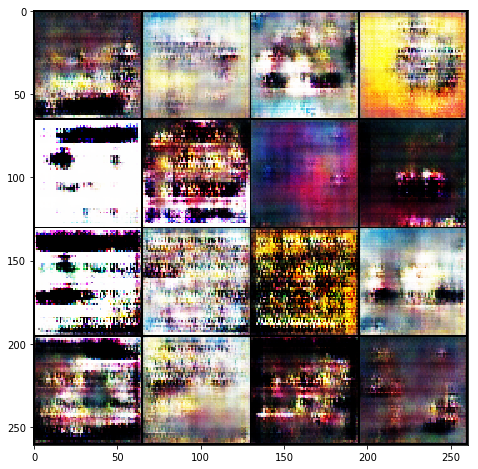

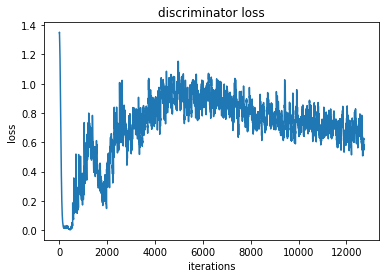

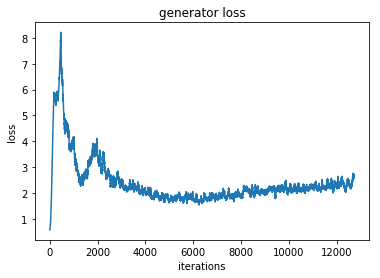

Iteration 12750/17200: dis loss = 0.9174, gen loss = 3.6926, 2.05 sec
Iteration 12800/17200: dis loss = 0.9722, gen loss = 0.9202, 1.71 sec
Iteration 12850/17200: dis loss = 0.9070, gen loss = 0.9152, 1.72 sec
Iteration 12900/17200: dis loss = 0.5025, gen loss = 2.0583, 1.70 sec
Iteration 12950/17200: dis loss = 0.5910, gen loss = 1.3067, 1.71 sec
Iteration 13000/17200: dis loss = 0.6134, gen loss = 1.5752, 1.72 sec
Iteration 13050/17200: dis loss = 2.1522, gen loss = 0.5881, 1.70 sec


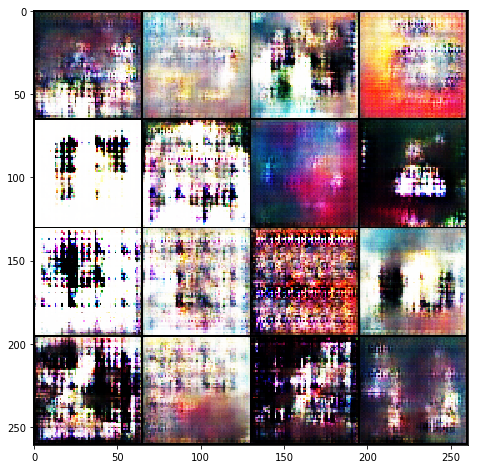

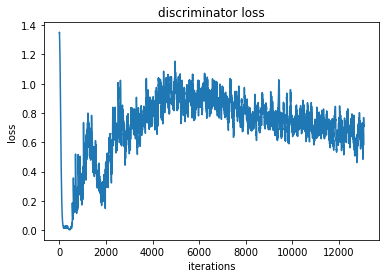

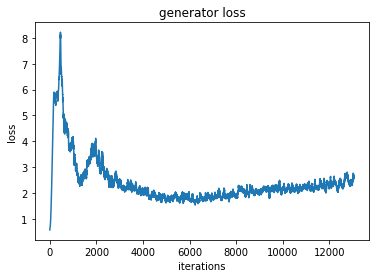

Iteration 13100/17200: dis loss = 0.3770, gen loss = 2.1200, 2.03 sec
Iteration 13150/17200: dis loss = 0.5095, gen loss = 1.8038, 1.69 sec
Iteration 13200/17200: dis loss = 0.7410, gen loss = 1.4469, 1.71 sec
Iteration 13250/17200: dis loss = 1.0363, gen loss = 3.8144, 1.68 sec
Iteration 13300/17200: dis loss = 1.1680, gen loss = 0.9881, 1.70 sec
Iteration 13350/17200: dis loss = 0.7742, gen loss = 2.2343, 1.71 sec
Iteration 13400/17200: dis loss = 0.2712, gen loss = 2.7760, 1.75 sec


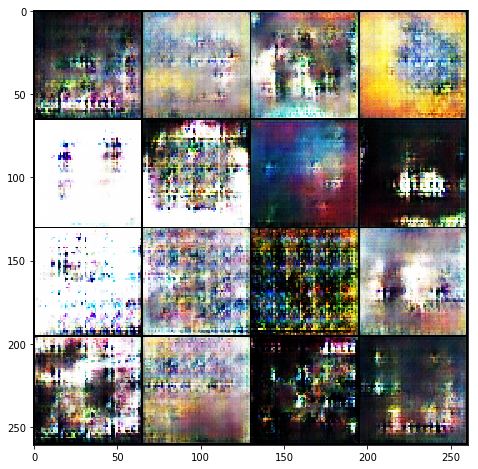

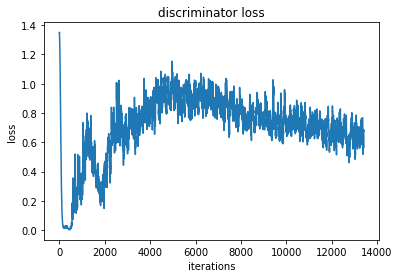

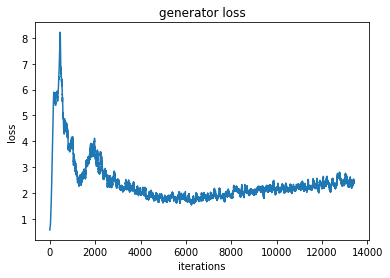

Iteration 13450/17200: dis loss = 0.5417, gen loss = 0.6500, 2.16 sec
Iteration 13500/17200: dis loss = 0.3500, gen loss = 2.4414, 1.72 sec
Iteration 13550/17200: dis loss = 0.5296, gen loss = 1.5619, 1.70 sec
Iteration 13600/17200: dis loss = 0.6853, gen loss = 3.6646, 1.74 sec
Iteration 13650/17200: dis loss = 0.5813, gen loss = 3.5439, 1.71 sec
Iteration 13700/17200: dis loss = 0.7068, gen loss = 1.5586, 1.81 sec
Iteration 13750/17200: dis loss = 0.7025, gen loss = 3.4376, 1.75 sec


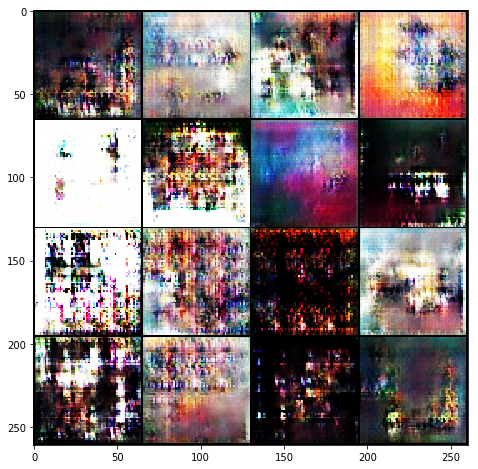

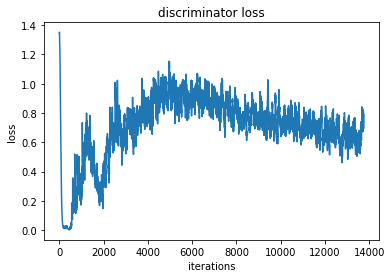

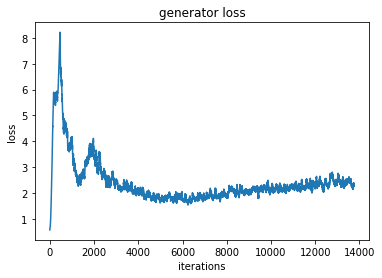

Iteration 13800/17200: dis loss = 0.4695, gen loss = 2.3243, 2.07 sec
Iteration 13850/17200: dis loss = 0.5643, gen loss = 2.6140, 1.75 sec
Iteration 13900/17200: dis loss = 0.6962, gen loss = 0.6819, 1.76 sec
Iteration 13950/17200: dis loss = 0.2307, gen loss = 3.6412, 1.75 sec
Iteration 14000/17200: dis loss = 0.5396, gen loss = 1.1842, 1.73 sec
Iteration 14050/17200: dis loss = 0.3882, gen loss = 3.6958, 1.75 sec
Iteration 14100/17200: dis loss = 0.6734, gen loss = 1.5299, 1.78 sec


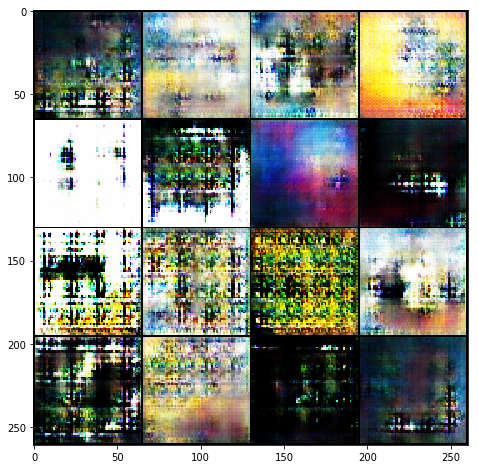

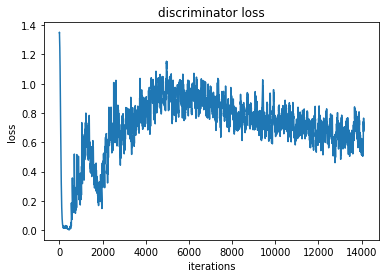

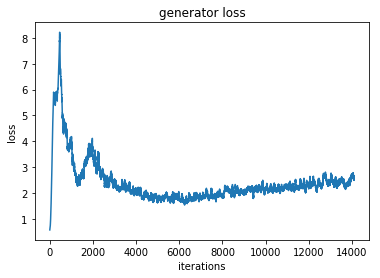

Iteration 14150/17200: dis loss = 0.6788, gen loss = 0.8480, 2.10 sec
Iteration 14200/17200: dis loss = 0.5934, gen loss = 2.5603, 1.74 sec
Iteration 14250/17200: dis loss = 0.8484, gen loss = 1.1334, 1.77 sec
Iteration 14300/17200: dis loss = 1.8272, gen loss = 1.8245, 1.74 sec
Iteration 14350/17200: dis loss = 0.2749, gen loss = 2.8503, 1.78 sec
Iteration 14400/17200: dis loss = 0.3622, gen loss = 2.5102, 1.72 sec


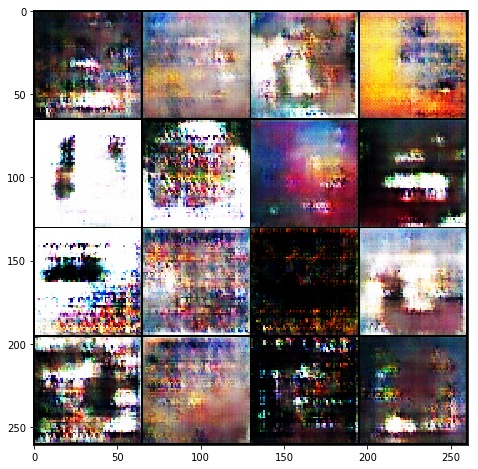

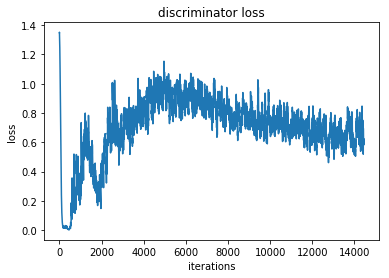

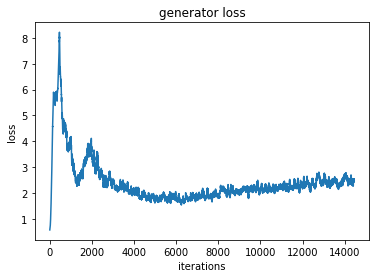

Iteration 14450/17200: dis loss = 0.4541, gen loss = 1.9480, 2.09 sec
Iteration 14500/17200: dis loss = 0.4974, gen loss = 2.0469, 1.72 sec
Iteration 14550/17200: dis loss = 0.3603, gen loss = 3.2104, 1.71 sec
Iteration 14600/17200: dis loss = 1.0706, gen loss = 1.5056, 1.73 sec
Iteration 14650/17200: dis loss = 0.3499, gen loss = 2.3204, 1.74 sec
Iteration 14700/17200: dis loss = 0.2660, gen loss = 3.1015, 1.75 sec
Iteration 14750/17200: dis loss = 0.4781, gen loss = 1.5944, 1.75 sec


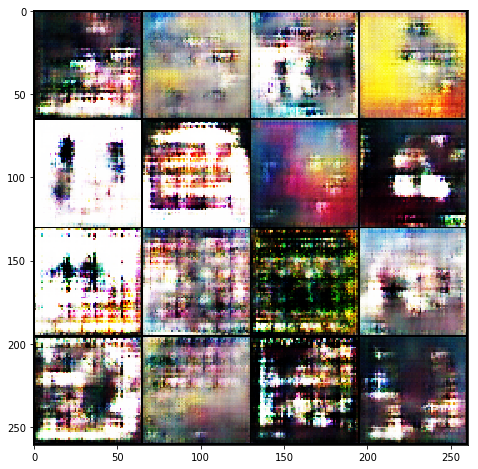

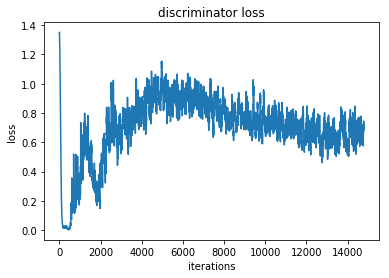

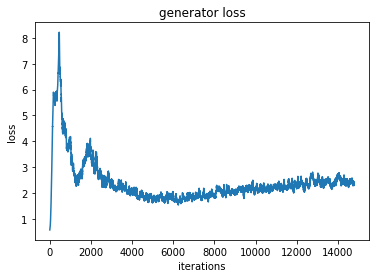

Iteration 14800/17200: dis loss = 1.6813, gen loss = 3.9564, 2.08 sec
Iteration 14850/17200: dis loss = 0.4798, gen loss = 2.1083, 1.78 sec
Iteration 14900/17200: dis loss = 0.6590, gen loss = 3.0886, 1.76 sec
Iteration 14950/17200: dis loss = 0.2762, gen loss = 2.5780, 1.73 sec
Iteration 15000/17200: dis loss = 0.3081, gen loss = 3.0121, 1.73 sec
Iteration 15050/17200: dis loss = 0.4592, gen loss = 1.2288, 1.73 sec
Iteration 15100/17200: dis loss = 0.4274, gen loss = 2.1744, 1.75 sec


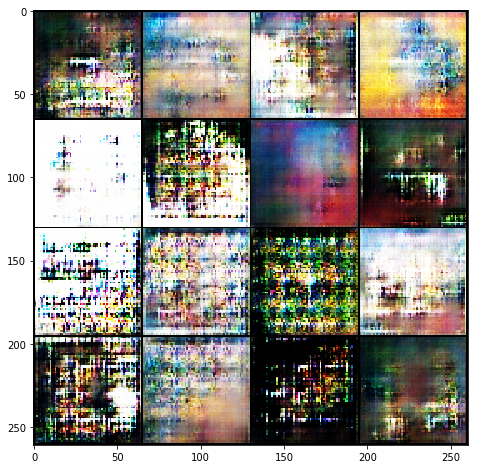

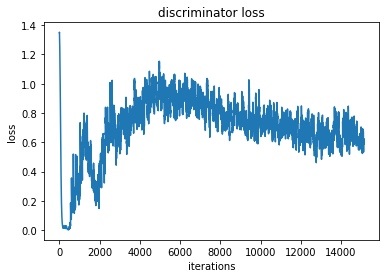

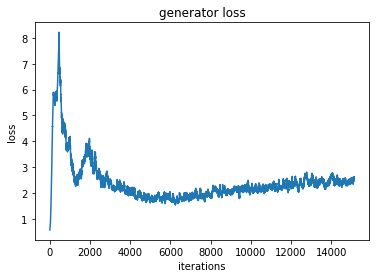

Iteration 15150/17200: dis loss = 0.3983, gen loss = 3.5675, 2.10 sec
Iteration 15200/17200: dis loss = 0.5248, gen loss = 1.9073, 1.80 sec
Iteration 15250/17200: dis loss = 0.5765, gen loss = 2.6864, 1.70 sec
Iteration 15300/17200: dis loss = 0.4873, gen loss = 2.0672, 1.78 sec
Iteration 15350/17200: dis loss = 0.4122, gen loss = 1.7898, 1.71 sec
Iteration 15400/17200: dis loss = 0.3841, gen loss = 2.2622, 1.73 sec
Iteration 15450/17200: dis loss = 0.3118, gen loss = 2.6090, 1.75 sec


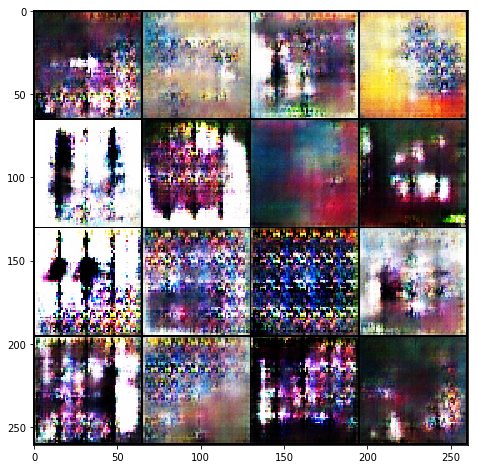

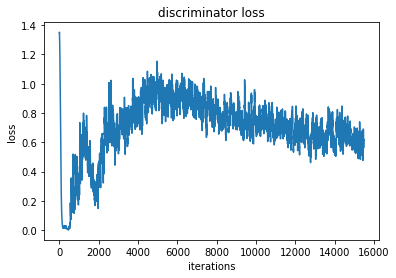

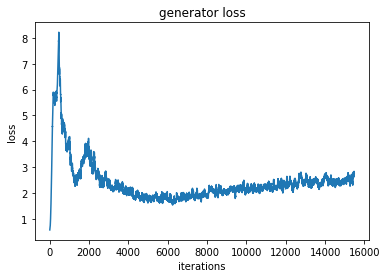

Iteration 15500/17200: dis loss = 0.4348, gen loss = 2.5243, 2.17 sec
Iteration 15550/17200: dis loss = 0.6430, gen loss = 3.1497, 1.73 sec
Iteration 15600/17200: dis loss = 0.6681, gen loss = 2.1461, 1.69 sec
Iteration 15650/17200: dis loss = 0.3966, gen loss = 2.2210, 1.73 sec
Iteration 15700/17200: dis loss = 0.5056, gen loss = 2.2401, 1.71 sec
Iteration 15750/17200: dis loss = 0.3711, gen loss = 2.5971, 1.69 sec
Iteration 15800/17200: dis loss = 1.0488, gen loss = 0.3733, 1.69 sec


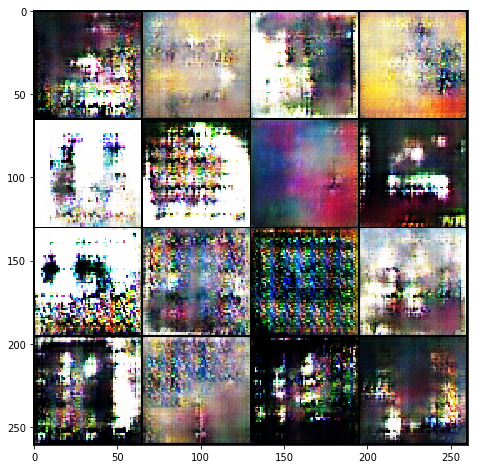

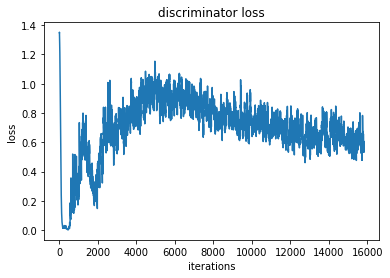

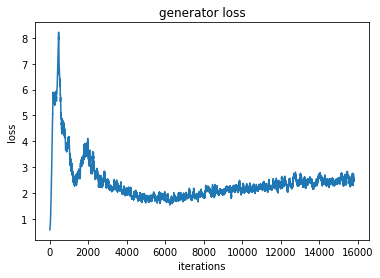

Iteration 15850/17200: dis loss = 0.5699, gen loss = 2.7998, 2.04 sec
Iteration 15900/17200: dis loss = 0.3530, gen loss = 2.0576, 1.68 sec
Iteration 15950/17200: dis loss = 0.6496, gen loss = 1.5366, 1.69 sec
Iteration 16000/17200: dis loss = 0.4523, gen loss = 2.2092, 1.70 sec
Iteration 16050/17200: dis loss = 0.3742, gen loss = 3.2214, 1.73 sec
Iteration 16100/17200: dis loss = 0.5504, gen loss = 2.1892, 1.69 sec
Iteration 16150/17200: dis loss = 0.4761, gen loss = 2.2806, 1.70 sec


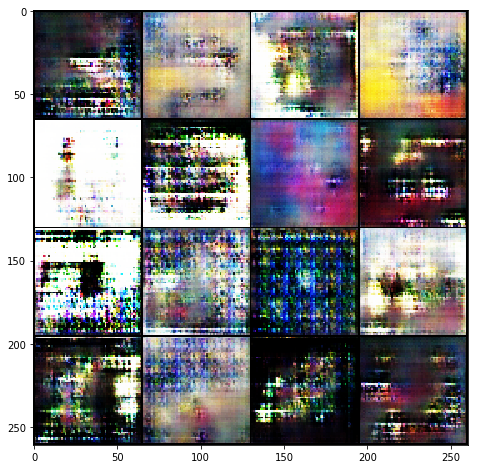

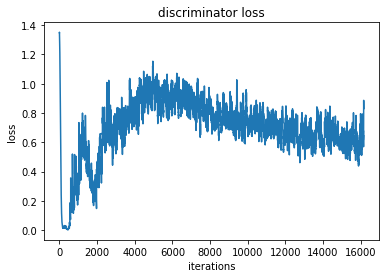

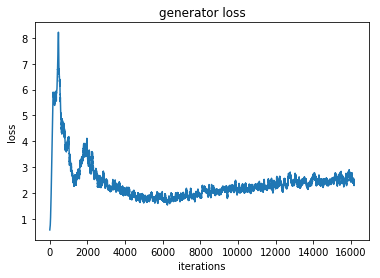

Iteration 16200/17200: dis loss = 0.8481, gen loss = 2.7812, 2.04 sec
Iteration 16250/17200: dis loss = 0.3154, gen loss = 2.2520, 1.71 sec
Iteration 16300/17200: dis loss = 1.0045, gen loss = 4.7908, 1.75 sec
Iteration 16350/17200: dis loss = 0.4123, gen loss = 3.1026, 1.78 sec
Iteration 16400/17200: dis loss = 0.4236, gen loss = 2.1791, 1.77 sec
Iteration 16450/17200: dis loss = 0.6434, gen loss = 1.8098, 1.78 sec
Iteration 16500/17200: dis loss = 0.2418, gen loss = 2.4648, 1.78 sec


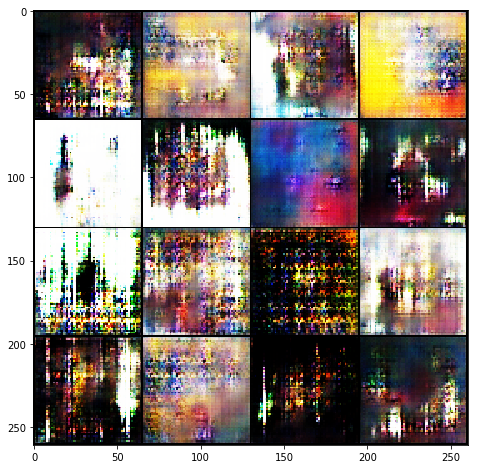

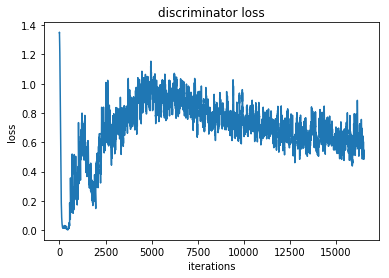

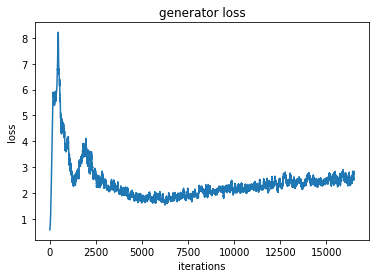

Iteration 16550/17200: dis loss = 0.4832, gen loss = 1.8116, 2.09 sec
Iteration 16600/17200: dis loss = 0.3344, gen loss = 2.1738, 1.72 sec
Iteration 16650/17200: dis loss = 0.5712, gen loss = 1.7745, 1.70 sec
Iteration 16700/17200: dis loss = 0.3807, gen loss = 2.8611, 1.74 sec
Iteration 16750/17200: dis loss = 0.6118, gen loss = 1.6473, 1.70 sec
Iteration 16800/17200: dis loss = 0.8780, gen loss = 3.4172, 1.76 sec
Iteration 16850/17200: dis loss = 0.6816, gen loss = 3.8285, 1.77 sec


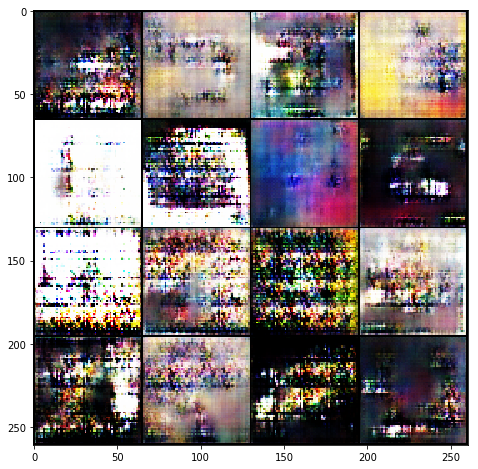

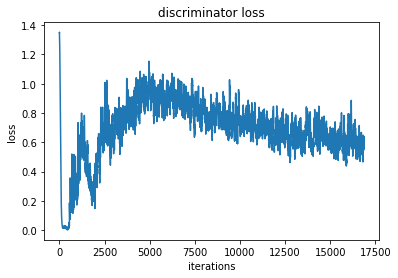

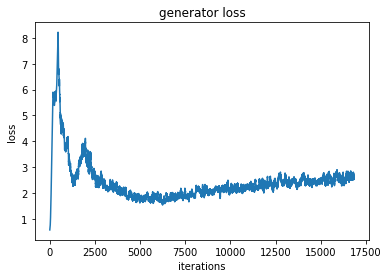

Iteration 16900/17200: dis loss = 0.2729, gen loss = 2.4915, 2.08 sec
Iteration 16950/17200: dis loss = 0.2756, gen loss = 2.1614, 1.70 sec
Iteration 17000/17200: dis loss = 0.3816, gen loss = 2.6594, 1.72 sec
Iteration 17050/17200: dis loss = 0.5374, gen loss = 2.5020, 1.74 sec
Iteration 17100/17200: dis loss = 0.4053, gen loss = 2.0822, 1.71 sec
Iteration 17150/17200: dis loss = 0.4704, gen loss = 3.6094, 1.71 sec
Iteration 17200/17200: dis loss = 0.2742, gen loss = 2.8153, 1.71 sec


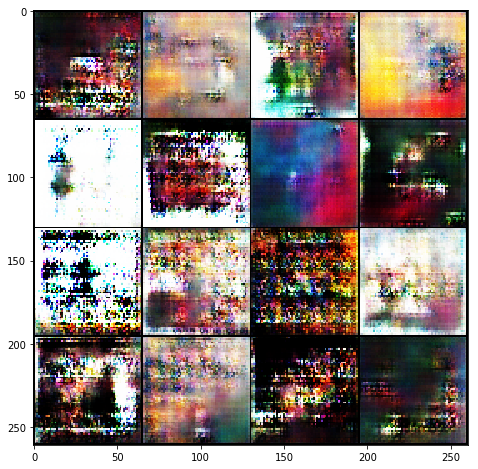

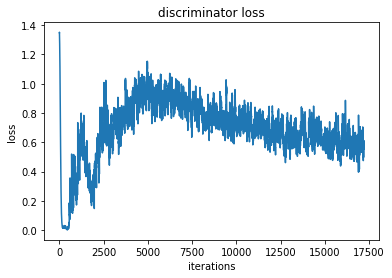

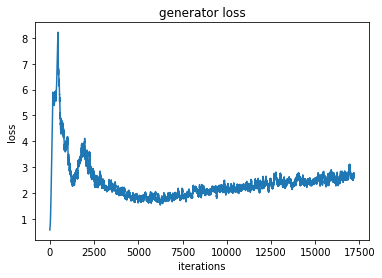

... Done!


In [12]:
tf.reset_default_graph()
set_seed(21)

with tf.Session(config=tf.ConfigProto(
        allow_soft_placement=True,log_device_placement=True)) as sess:
    with tf.device('/gpu:0'):
        dcgan = DCGAN()
        sess.run(tf.global_variables_initializer())
        dcgan.train(sess, train_samples)
        dis_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'dis')
        gen_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'gen')
        saver = tf.train.Saver(dis_var_list + gen_var_list)
        saver.save(sess, 'model/dcgan_input64')


INFO:tensorflow:Restoring parameters from model/dcgan_input64


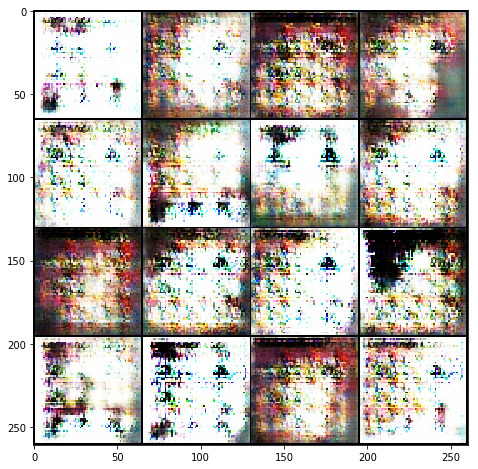

In [15]:
tf.reset_default_graph()
set_seed(241)

with tf.Session(config=tf.ConfigProto(
        allow_soft_placement=True,log_device_placement=True)) as sess:
    with tf.device('/gpu:0'):
        dcgan = DCGAN()
        sess.run(tf.global_variables_initializer())
        dis_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'dis')
        gen_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'gen')
        saver = tf.train.Saver(dis_var_list + gen_var_list)
        saver.restore(sess, 'model/dcgan_input64')
        actmax_results = dcgan.actmax(np.random.random([16, dcgan.code_size]))
        fig = plt.figure(figsize = (8, 8))   
        ax1 = plt.subplot(111)
        ax1.imshow(viz_grid(actmax_results, 1))
        plt.show()

INFO:tensorflow:Restoring parameters from model/dcgan_input64
average reconstruction loss = 82.3874


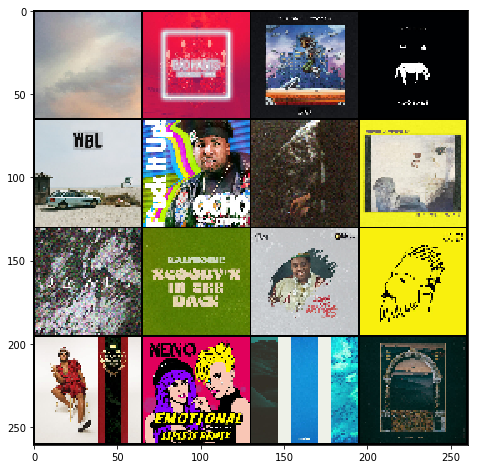

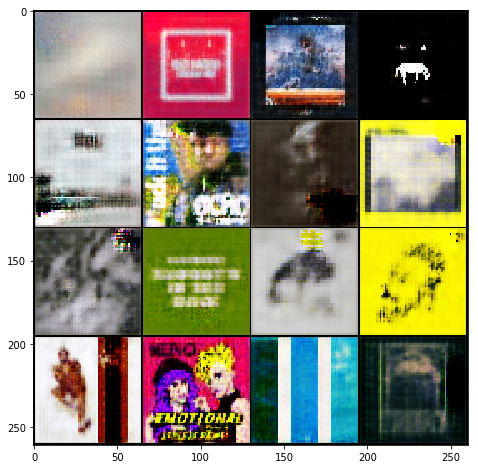

In [16]:
tf.reset_default_graph()

with tf.Session(config=tf.ConfigProto(
        allow_soft_placement=True,log_device_placement=True)) as sess:
    with tf.device('/gpu:0'):
        dcgan = DCGAN()
        sess.run(tf.global_variables_initializer())
        dis_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'dis')
        gen_var_list = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, 'gen')
        saver = tf.train.Saver(dis_var_list + gen_var_list)
        saver.restore(sess, 'model/dcgan_input64')

        avg_loss, reconstructions = dcgan.reconstruct(test_samples[0:16])
        print('average reconstruction loss = {0:.4f}'.format(avg_loss))
        fig = plt.figure(figsize = (8, 8))   
        ax1 = plt.subplot(111)
        ax1.imshow(viz_grid(test_samples[0:16], 1))
        plt.show()
        fig = plt.figure(figsize = (8, 8))   
        ax1 = plt.subplot(111)
        ax1.imshow(viz_grid(reconstructions, 1))
        plt.show()